In [1]:
import sys
sys.path.append("../") # adding the path to read the utils file
from sklearnex import patch_sklearn
patch_sklearn(global_patch=True)
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, StratifiedKFold
from catboost import CatBoostClassifier
from sklearn import metrics, tree
from shap import TreeExplainer
import fasttreeshap
from shap import plots, Explanation
import graphviz 
from yellowbrick.model_selection import LearningCurve
import time
import shap
from utils import *
import pickle
import glob
from yellowbrick.classifier import ROCAUC
from yellowbrick.contrib.wrapper import wrap

pd.set_option('display.max_columns', None)

Scikit-learn was successfully globally patched by Intel(R) Extension for Scikit-learn


Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)
IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


In [2]:
ds = pd.concat([pd.read_csv(csv_file, engine='pyarrow', index_col='id') for csv_file in glob.glob('../datasets/NFS-2023-nTE/*.csv')], ignore_index=True)
ds.head()

,expiration_id,src_ip,src_mac,src_oui,src_port,dst_ip,dst_mac,dst_oui,dst_port,protocol,ip_version,vlan_id,bidirectional_first_seen_ms,bidirectional_last_seen_ms,bidirectional_duration_ms,bidirectional_packets,bidirectional_bytes,src2dst_first_seen_ms,src2dst_last_seen_ms,src2dst_duration_ms,src2dst_packets,src2dst_bytes,dst2src_first_seen_ms,dst2src_last_seen_ms,dst2src_duration_ms,dst2src_packets,dst2src_bytes,bidirectional_min_ps,bidirectional_mean_ps,bidirectional_stddev_ps,bidirectional_max_ps,src2dst_min_ps,src2dst_mean_ps,src2dst_stddev_ps,src2dst_max_ps,dst2src_min_ps,dst2src_mean_ps,dst2src_stddev_ps,dst2src_max_ps,bidirectional_min_piat_ms,bidirectional_mean_piat_ms,bidirectional_stddev_piat_ms,bidirectional_max_piat_ms,src2dst_min_piat_ms,src2dst_mean_piat_ms,src2dst_stddev_piat_ms,src2dst_max_piat_ms,dst2src_min_piat_ms,dst2src_mean_piat_ms,dst2src_stddev_piat_ms,dst2src_max_piat_ms,bidirectional_syn_packets,bidirectional_cwr_packets,bidirectional_ece_packets,bidirectional_urg_packets,bidirectional_ack_packets,bidirectional_psh_packets,bidirectional_rst_packets,bidirectional_fin_packets,src2dst_syn_packets,src2dst_cwr_packets,src2dst_ece_packets,src2dst_urg_packets,src2dst_ack_packets,src2dst_psh_packets,src2dst_rst_packets,src2dst_fin_packets,dst2src_syn_packets,dst2src_cwr_packets,dst2src_ece_packets,dst2src_urg_packets,dst2src_ack_packets,dst2src_psh_packets,dst2src_rst_packets,dst2src_fin_packets,label
0,1,192.168.10.50,00:19:b9:0a:69:f1,00:19:b9,33898,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,389,6,4,0,1499342340490,1499342453585,113095,36,12216,1499342340490,1499342453585,113095,24,6418,1499342340490,1499342453585,113095,12,5798,66,339.333333,236.650194,989,66,267.416667,205.748880,469,382,483.166667,236.274430,989,0,3231.285714,6169.592586,16483,0,4917.173913,7082.328024,16483,3,10281.363636,7053.298154,16483,0,0,0,0,36,24,0,0,0,0,0,0,24,12,0,0,0,0,0,0,12,12,0,0,BENIGN
1,1,192.168.10.50,00:19:b9:0a:69:f1,00:19:b9,33904,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,389,6,4,0,1499342340491,1499342453964,113473,54,15605,1499342340491,1499342453964,113473,34,7926,1499342340491,1499342453918,113427,20,7679,66,288.981481,200.112750,1205,66,233.117647,173.216936,469,192,383.950000,210.983780,1205,0,2141.000000,5223.952902,16483,0,3438.575758,6304.323294,16483,0,5969.842105,7399.526406,16483,0,0,0,0,54,40,0,0,0,0,0,0,34,20,0,0,0,0,0,0,20,20,0,0,BENIGN
2,0,192.168.10.14,b8:ac:6f:36:07:ee,b8:ac:6f,59555,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,53,17,4,0,1499342357298,1499342357299,1,2,296,1499342357298,1499342357298,0,1,93,1499342357299,1499342357299,0,1,203,93,148.000000,77.781746,203,93,93.000000,0.000000,93,203,203.000000,0.000000,203,1,1.000000,0.000000,1,0,0.000000,0.000000,0,0,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,BENIGN
3,0,192.168.10.14,b8:ac:6f:36:07:ee,b8:ac:6f,59135,65.55.44.109,00:c1:b1:14:eb:31,00:c1:b1,443,6,4,0,1499342357299,1499342417611,60312,18,7559,1499342357299,1499342417611,60312,10,2888,1499342357349,1499342417610,60261,8,4671,60,419.944444,522.680700,1514,60,288.800000,393.690177,1147,60,583.875000,639.465723,1514,0,3547.764706,14539.437969,59969,0,6701.333333,19975.413926,59969,0,8608.714286,22683.047882,60049,2,0,0,0,17,7,0,2,1,0,0,0,9,4,0,1,1,0,0,0,8,3,0,1,BENIGN
4,0,192.168.10.50,00:19:b9:0a:69:f1,00:19:b9,123,129.6.15.29,00:c1:b1:14:eb:31,00:c1:b1,123,17,4,0,1499342395411,1499342395442,31,2,180,1499342395411,1499342395411,0,1,90,1499342395442,1499342395442,0,1,90,90,90.000000,0.000000,90,90,90.000000,0.000000,90,90,90.000000,0.000000,90,31,31.000000,0.000000,31,0,0.000000,0.000000,0,0,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,BENIGN


In [3]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2111131 entries, 0 to 2111130
Data columns (total 76 columns):
 #   Column                        Dtype  
---  ------                        -----  
 0   expiration_id                 int64  
 1   src_ip                        object 
 2   src_mac                       object 
 3   src_oui                       object 
 4   src_port                      int64  
 5   dst_ip                        object 
 6   dst_mac                       object 
 7   dst_oui                       object 
 8   dst_port                      int64  
 9   protocol                      int64  
 10  ip_version                    int64  
 11  vlan_id                       int64  
 12  bidirectional_first_seen_ms   int64  
 13  bidirectional_last_seen_ms    int64  
 14  bidirectional_duration_ms     int64  
 15  bidirectional_packets         int64  
 16  bidirectional_bytes           int64  
 17  src2dst_first_seen_ms         int64  
 18  src2dst_last_seen_ms  

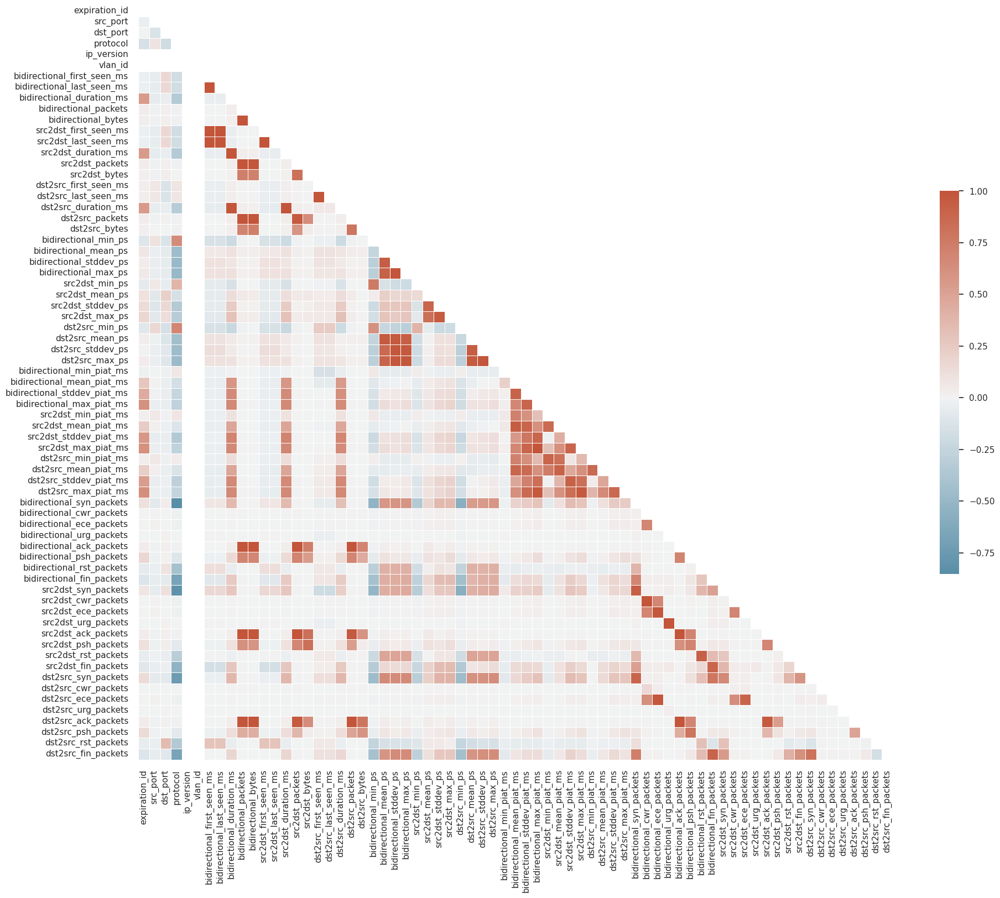

In [4]:
show_corr_matrix(ds)

In [5]:
compute_ratio(ds,'label')

                            Ratio
label                            
BENIGN                      76.37
PortScan                    10.61
DoS Hulk                     7.49
DDoS                         4.41
DoS GoldenEye                0.37
DoS slowloris                0.25
FTP-Patator                  0.19
SSH-Patator                  0.14
DoS Slowhttptest             0.13
Bot                          0.03
Web Attack - Brute Force     0.01
Web Attack - XSS             0.00
Infiltration                 0.00
Web Attack - Sql Injection   0.00
Heartbleed                   0.00


In [6]:
ds.label.value_counts()

label
BENIGN                        1612267
PortScan                       223886
DoS Hulk                       158027
DDoS                            93178
DoS GoldenEye                    7916
DoS slowloris                    5192
FTP-Patator                      3992
SSH-Patator                      2980
DoS Slowhttptest                 2727
Bot                               738
Web Attack - Brute Force          151
Web Attack - XSS                   27
Infiltration                       27
Web Attack - Sql Injection         12
Heartbleed                         11
Name: count, dtype: int64

In [7]:
ds = ds.drop(columns=['expiration_id','src_ip','src_mac','src_oui','src_port','dst_ip','dst_mac','dst_oui','dst_port','ip_version','vlan_id'])

In [8]:
sample_weights = ds.label.value_counts().to_dict()

In [9]:
sample_weights['BENIGN'] = 738
sample_weights['PortScan'] = 738
sample_weights['DoS Hulk'] = 738
sample_weights['DDoS'] = 738
sample_weights['FTP-Patator'] = 738
sample_weights['DoS GoldenEye'] = 738
sample_weights['DoS slowloris'] = 738
sample_weights['SSH-Patator'] = 738
sample_weights['DoS Slowhttptest'] = 738

In [10]:
params = {
    'iterations': 80,
    'depth': 9,
    'learning_rate': 0.1,
    'loss_function': 'MultiClass',
    'verbose': True
}

cat = CatBoostClassifier(**params)

rus = RandomUnderSampler(random_state=42, sampling_strategy=sample_weights)
X_res, y_res = rus.fit_resample(ds.drop(columns=['label']), ds['label'])

In [11]:
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size = 0.2, random_state=12, shuffle=True, stratify=y_res)

In [14]:
if False:
    cv = 5
    visualizer = LearningCurve(estimator=cat, cv=cv, scoring='f1_weighted', n_jobs=1, random_state=123)
    visualizer.fit(X_train, y_train)
    visualizer.show(outpath="cat_data/learning_curve.png")


![Alt text](cat_data/learning_curve.png)

In [15]:
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
skf.get_n_splits(X_res, y_res)

5

In [16]:
avg_train_f1 = []
avg_test_f1 = []

for i, (train_index, test_index) in enumerate(skf.split(X_res, y_res)):
    print(f"Fold {i}:")
    cat.fit(X_res.iloc[train_index], y_res.iloc[train_index])
    y_predicted_train = cat.predict(X_res.iloc[train_index])
    y_predicted_test = cat.predict(X_res.iloc[test_index])
    train_f1 = metrics.f1_score(y_res.iloc[train_index], y_predicted_train, average='weighted')
    test_f1 = metrics.f1_score(y_res.iloc[test_index], y_predicted_test, average='weighted')
    print(f"Train F1: {train_f1:.4f}")
    print(f"Test F1: {test_f1:.4f}")
    avg_train_f1.append(train_f1)
    avg_test_f1.append(test_f1)

print(f"Average Train F1: {np.mean(avg_train_f1):.4f}")
print(f"Average Test F1: {np.mean(avg_test_f1):.4f}")

Fold 0:
0:	learn: 1.6895988	total: 464ms	remaining: 36.7s
1:	learn: 1.3462751	total: 849ms	remaining: 33.1s
2:	learn: 1.1296305	total: 1.25s	remaining: 32s
3:	learn: 0.9677634	total: 1.65s	remaining: 31.3s
4:	learn: 0.8414419	total: 2.04s	remaining: 30.6s
5:	learn: 0.7391796	total: 2.42s	remaining: 29.9s
6:	learn: 0.6545563	total: 2.85s	remaining: 29.7s
7:	learn: 0.5857734	total: 3.23s	remaining: 29s
8:	learn: 0.5262772	total: 3.67s	remaining: 29s


9:	learn: 0.4726340	total: 3.98s	remaining: 27.8s
10:	learn: 0.4282285	total: 4.21s	remaining: 26.4s
11:	learn: 0.3882380	total: 4.37s	remaining: 24.8s
12:	learn: 0.3538192	total: 4.55s	remaining: 23.5s
13:	learn: 0.3250526	total: 4.73s	remaining: 22.3s
14:	learn: 0.2984508	total: 4.91s	remaining: 21.3s
15:	learn: 0.2735631	total: 5.11s	remaining: 20.4s
16:	learn: 0.2511493	total: 5.29s	remaining: 19.6s
17:	learn: 0.2321751	total: 5.47s	remaining: 18.8s
18:	learn: 0.2143882	total: 5.64s	remaining: 18.1s
19:	learn: 0.1985207	total: 5.81s	remaining: 17.4s
20:	learn: 0.1845115	total: 5.99s	remaining: 16.8s
21:	learn: 0.1713701	total: 6.16s	remaining: 16.2s
22:	learn: 0.1593566	total: 6.33s	remaining: 15.7s
23:	learn: 0.1488817	total: 6.5s	remaining: 15.2s
24:	learn: 0.1392037	total: 6.68s	remaining: 14.7s
25:	learn: 0.1303612	total: 6.85s	remaining: 14.2s
26:	learn: 0.1217562	total: 7.02s	remaining: 13.8s
27:	learn: 0.1145681	total: 7.19s	remaining: 13.4s
28:	learn: 0.1080144	total: 7.37s

In [17]:
%time cat.fit(X_train, y_train)

0:	learn: 1.6784801	total: 238ms	remaining: 18.8s
1:	learn: 1.3489238	total: 468ms	remaining: 18.2s
2:	learn: 1.1361166	total: 728ms	remaining: 18.7s
3:	learn: 0.9726076	total: 960ms	remaining: 18.2s
4:	learn: 0.8490088	total: 1.2s	remaining: 18s
5:	learn: 0.7483197	total: 1.45s	remaining: 17.8s
6:	learn: 0.6639806	total: 1.69s	remaining: 17.7s
7:	learn: 0.5899359	total: 1.94s	remaining: 17.5s
8:	learn: 0.5314331	total: 2.19s	remaining: 17.3s
9:	learn: 0.4807795	total: 2.44s	remaining: 17.1s
10:	learn: 0.4348076	total: 2.7s	remaining: 16.9s
11:	learn: 0.3947474	total: 2.95s	remaining: 16.7s
12:	learn: 0.3589233	total: 3.2s	remaining: 16.5s
13:	learn: 0.3277567	total: 3.46s	remaining: 16.3s
14:	learn: 0.2991034	total: 3.71s	remaining: 16.1s
15:	learn: 0.2742760	total: 3.96s	remaining: 15.8s
16:	learn: 0.2520416	total: 4.21s	remaining: 15.6s
17:	learn: 0.2328539	total: 4.46s	remaining: 15.4s
18:	learn: 0.2151086	total: 4.71s	remaining: 15.1s
19:	learn: 0.2002328	total: 4.96s	remaining: 1

In [18]:
%time y_predicted_train = cat.predict(X_train)
%time y_predicted_test = cat.predict(X_test)

CPU times: user 17.1 ms, sys: 2.02 ms, total: 19.1 ms
Wall time: 5.08 ms
CPU times: user 7.72 ms, sys: 31 µs, total: 7.75 ms
Wall time: 4.65 ms


In [19]:
performanceMetricsDFWeighted(metrics, y_train, y_predicted_train, y_test, y_predicted_test, 'weighted')

,Measure,Train,Test
0,ACCURACY,0.997700,0.993430
1,PRECISION,0.997704,0.993503
2,RECALL,0.997700,0.993430
3,F1 SCORE,0.997690,0.993006


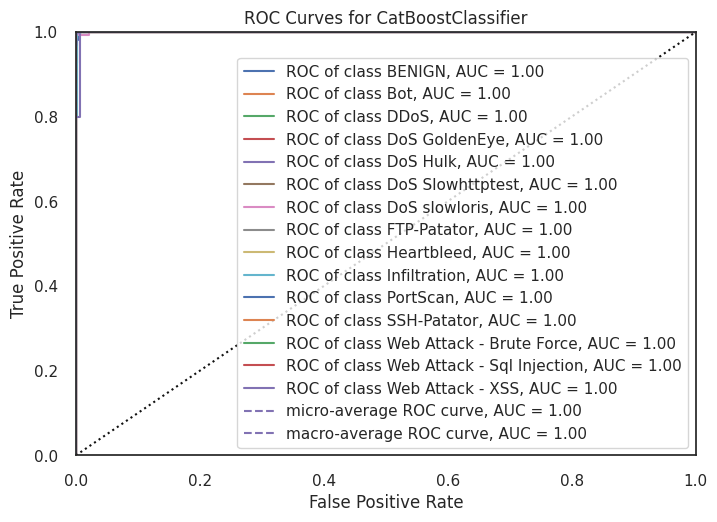

<Axes: title={'center': 'ROC Curves for CatBoostClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [20]:
model = wrap(cat)
visualizer = ROCAUC(model)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show()

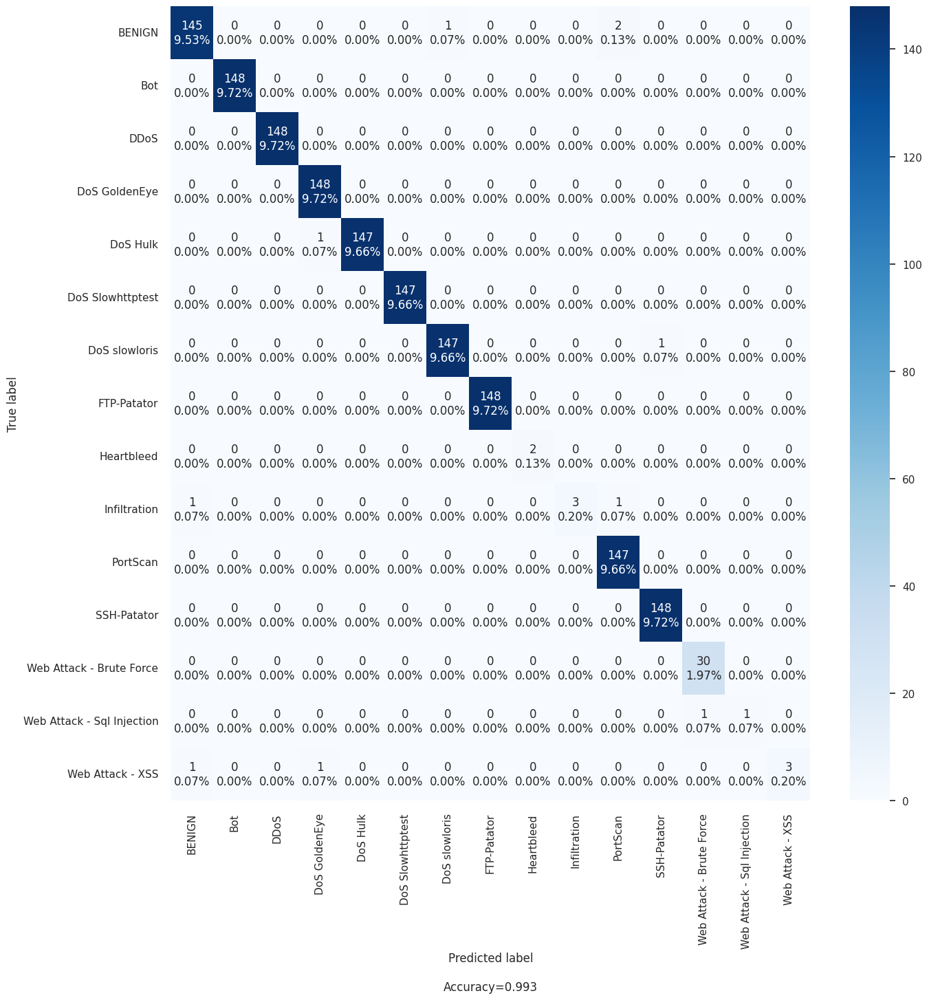

In [21]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(cat.classes_)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

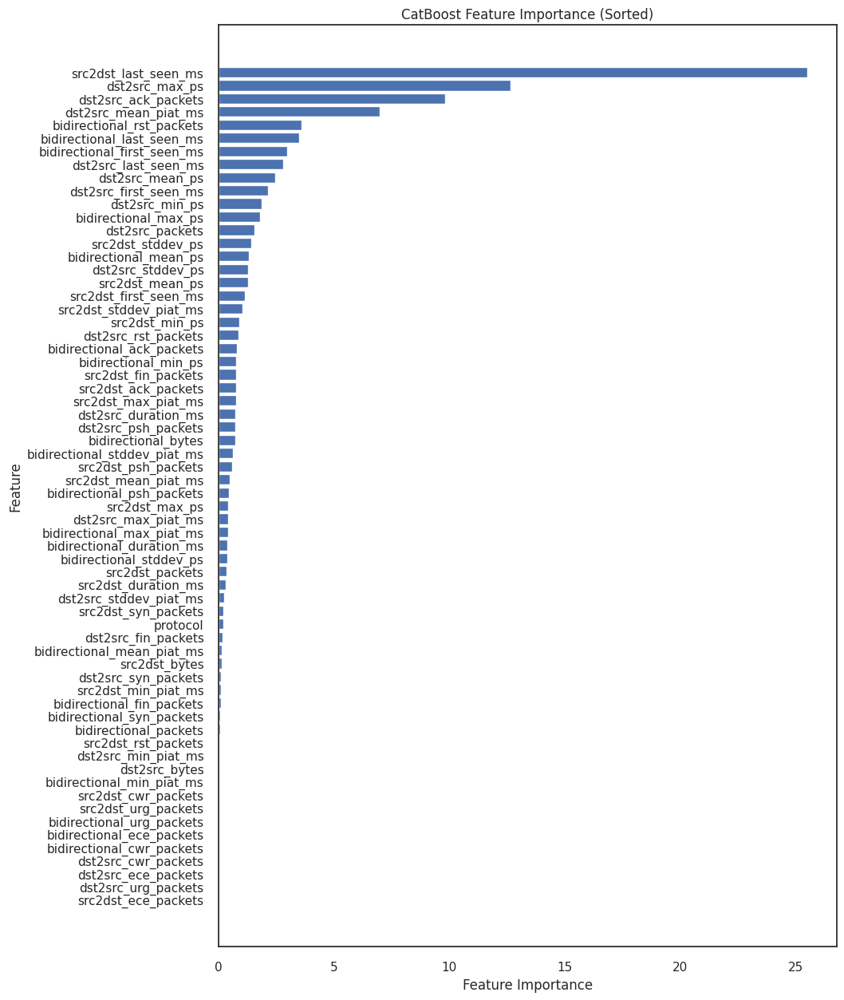

In [22]:
# Retrieve feature importance
feature_importance = model.get_feature_importance(type="FeatureImportance")
feature_names = X_train.columns

# Sort the features and feature importance scores
sorted_indices = np.argsort(feature_importance)
sorted_feature_importance = feature_importance[sorted_indices]
sorted_feature_names = feature_names[sorted_indices]

# Plot the sorted feature importance
plt.figure(figsize=(10, 15))
plt.barh(sorted_feature_names, sorted_feature_importance)
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('CatBoost Feature Importance (Sorted)')
plt.show()

Using interventional to stay "true to the model" since we will use this data to do feature reduction and we want also to understand how things work

In [23]:
%%time

explainer = fasttreeshap.TreeExplainer(cat, algorithm='auto', n_jobs=-1) 
sv = explainer(X_train)

CPU times: user 1min 14s, sys: 512 ms, total: 1min 15s
Wall time: 7.97 s


In [24]:
cat.classes_

array(['BENIGN', 'Bot', 'DDoS', 'DoS GoldenEye', 'DoS Hulk',
       'DoS Slowhttptest', 'DoS slowloris', 'FTP-Patator', 'Heartbleed',
       'Infiltration', 'PortScan', 'SSH-Patator',
       'Web Attack - Brute Force', 'Web Attack - Sql Injection',
       'Web Attack - XSS'], dtype=object)

## Benign shap

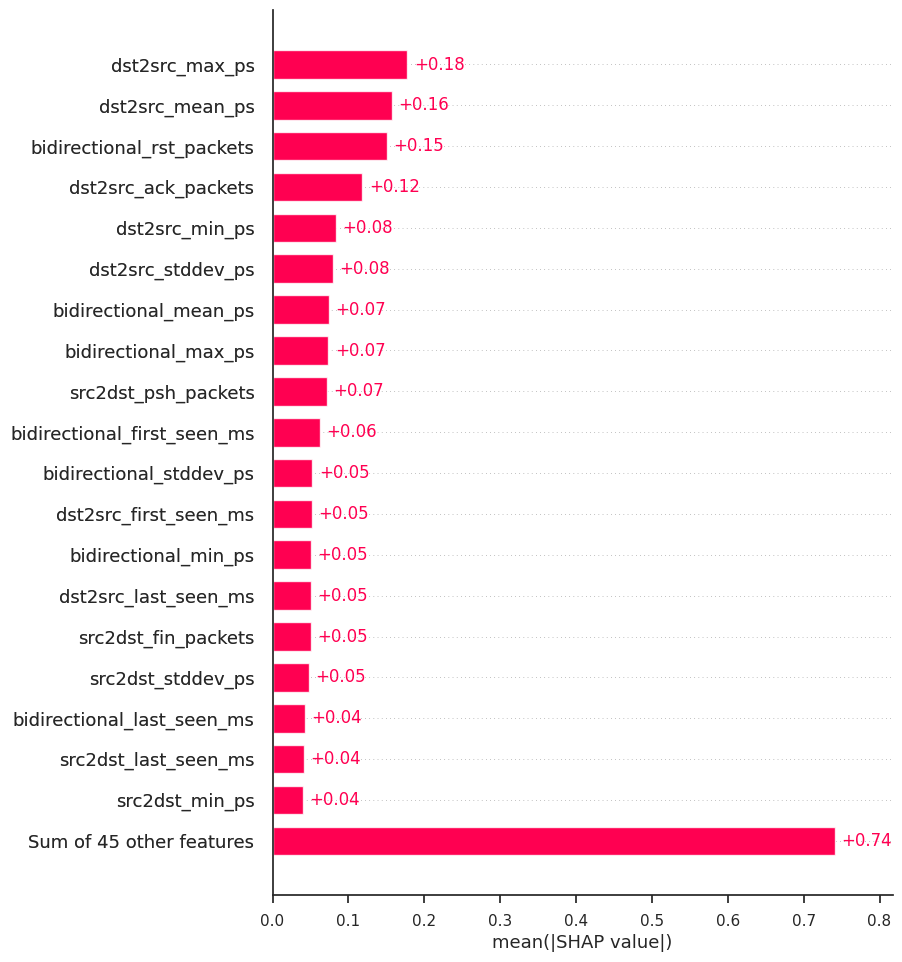

In [25]:
exp = Explanation(sv.values[:,:,0], 
                  sv.base_values[:,0], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

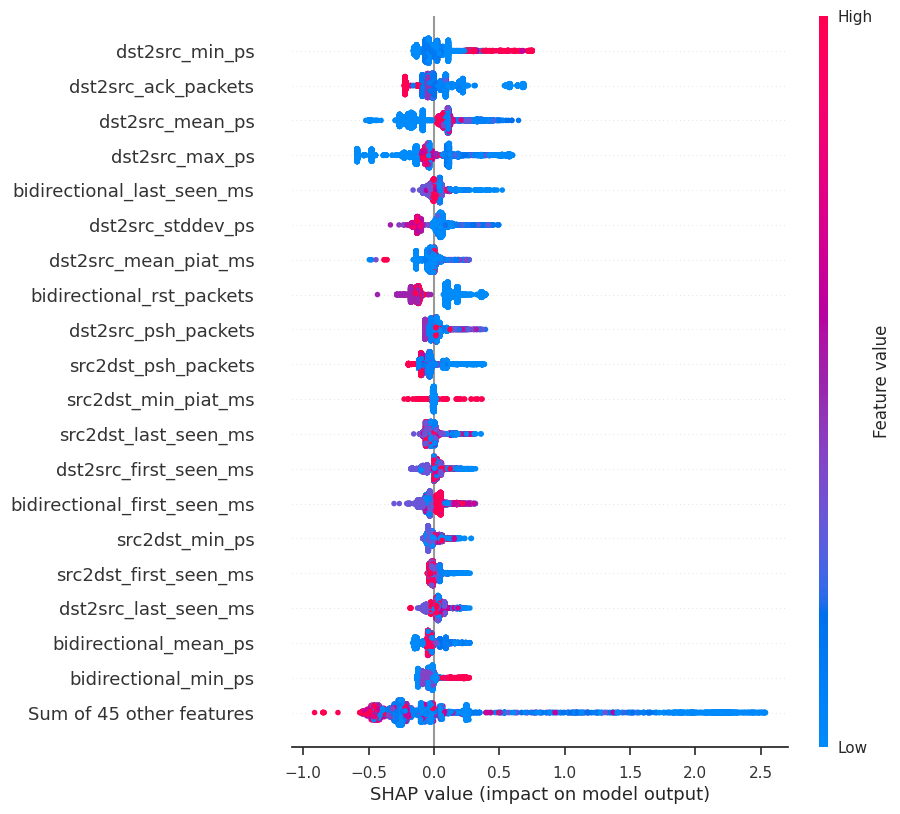

In [26]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

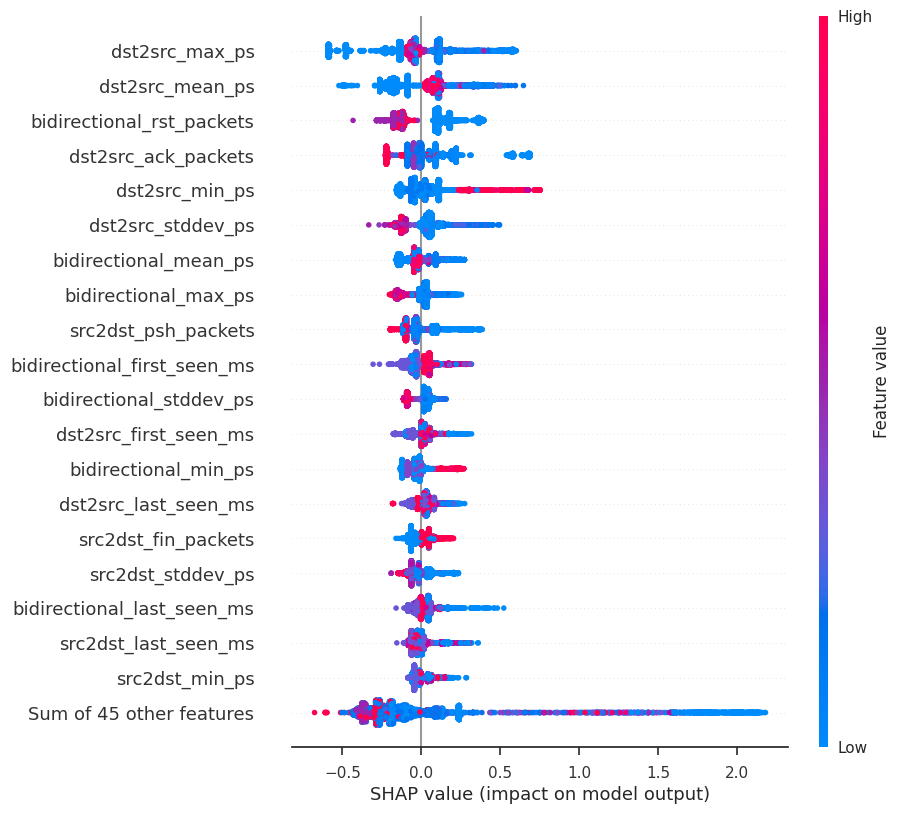

In [27]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Bot shap

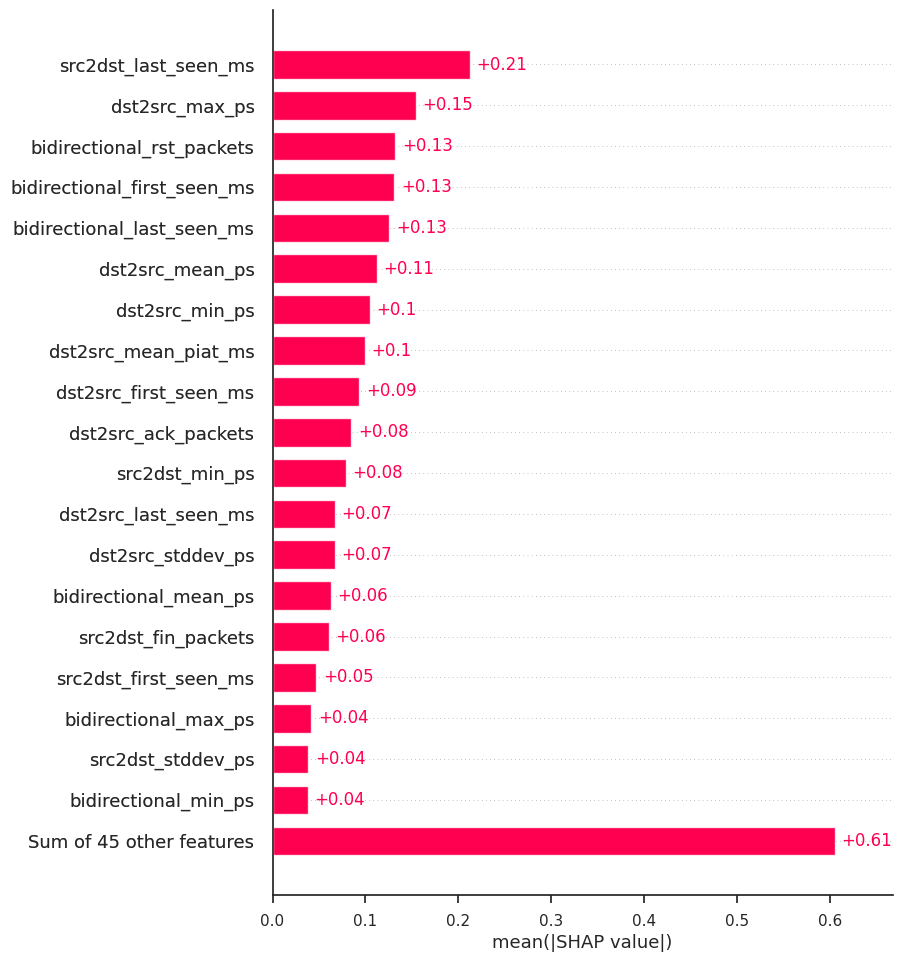

In [28]:
exp = Explanation(sv.values[:,:,1], 
                  sv.base_values[:,1], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)

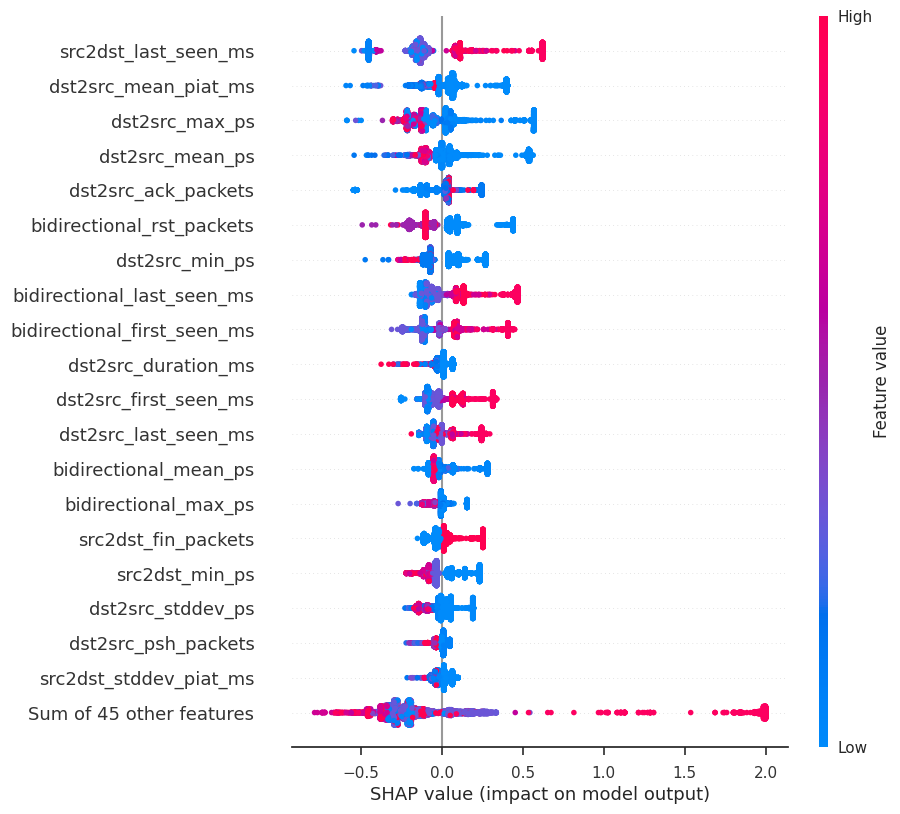

In [29]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

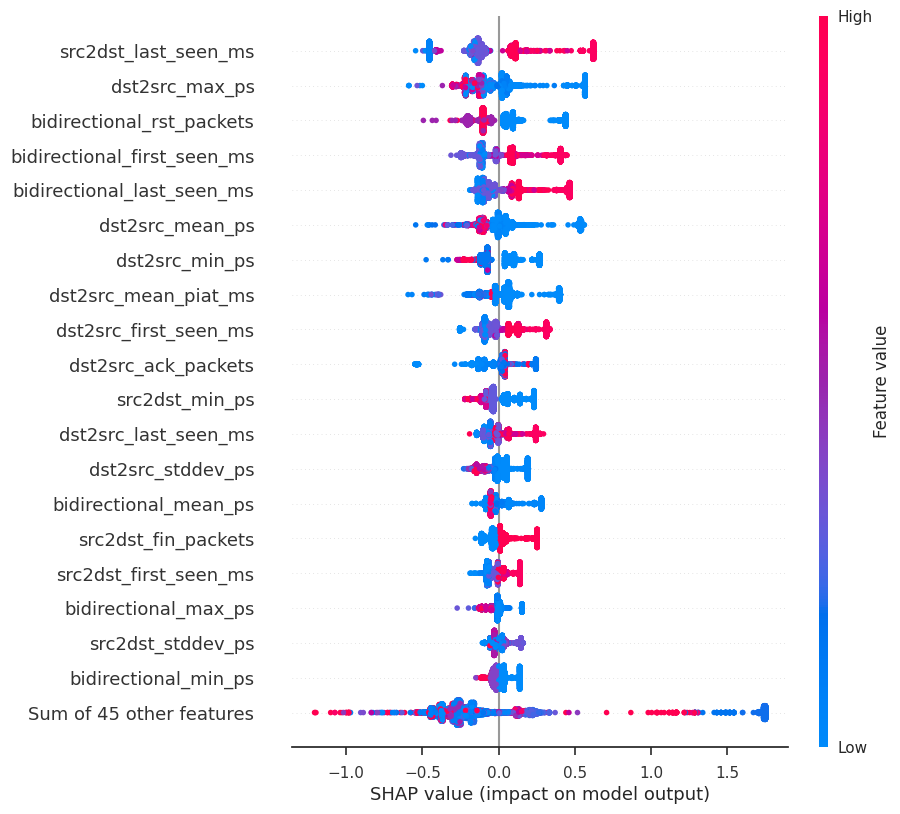

In [30]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## DDoS shap

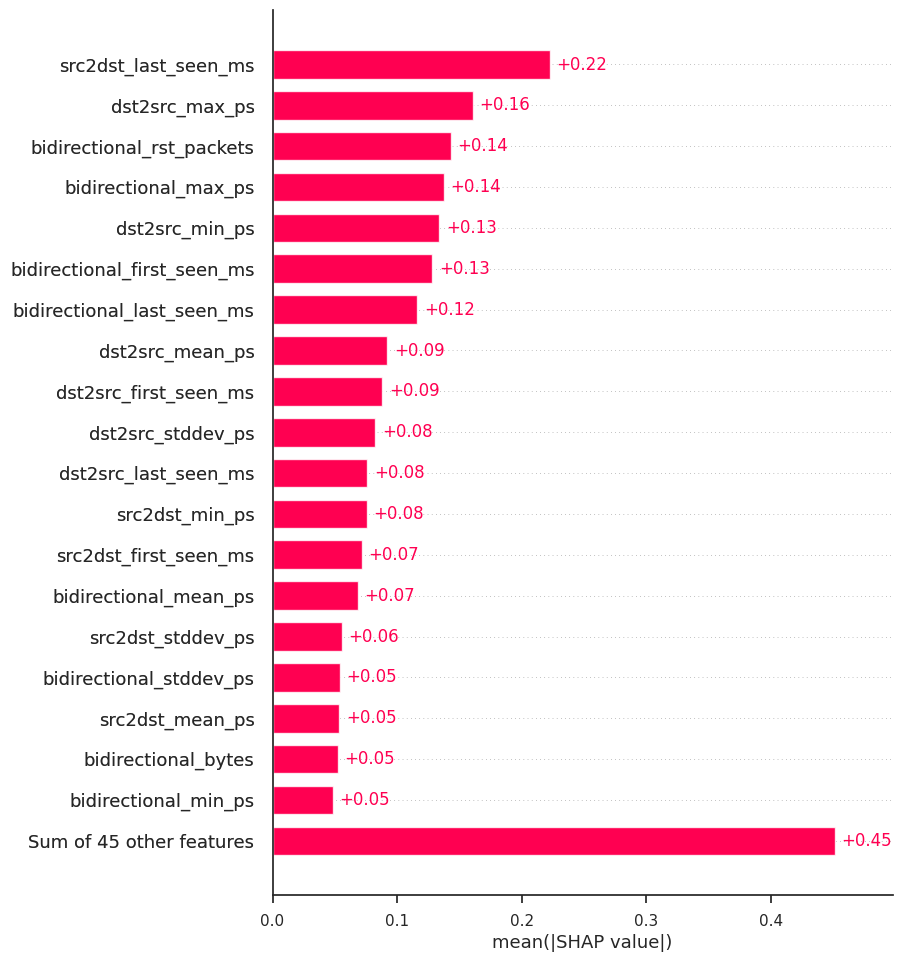

In [31]:
exp = Explanation(sv.values[:,:,2], 
                  sv.base_values[:,2], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)

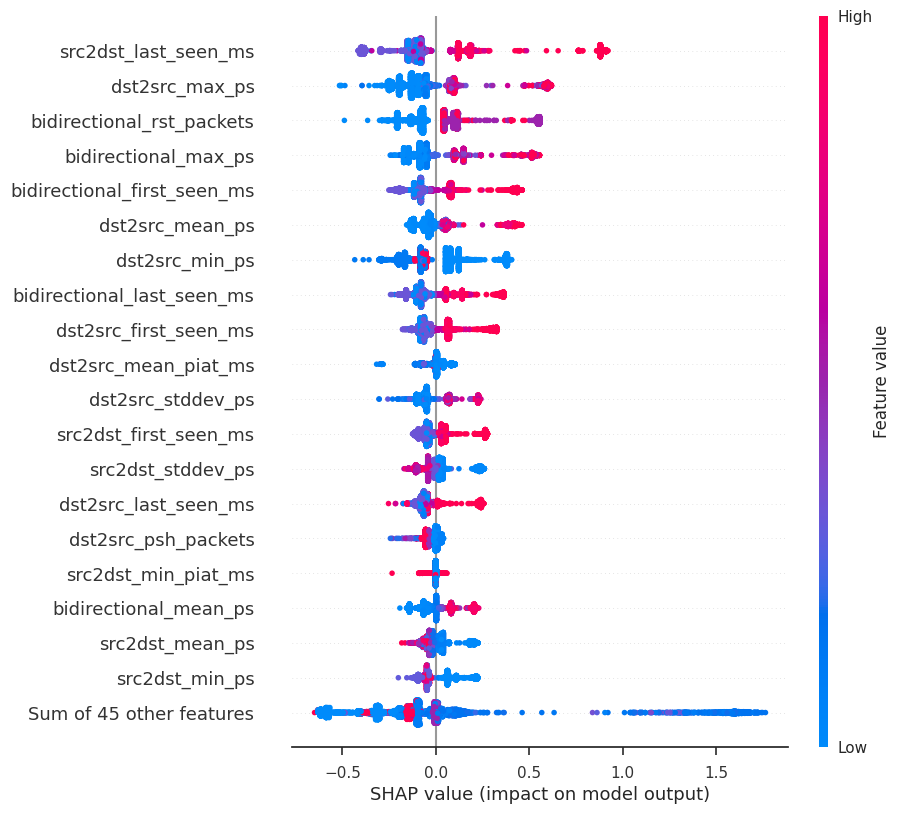

In [32]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

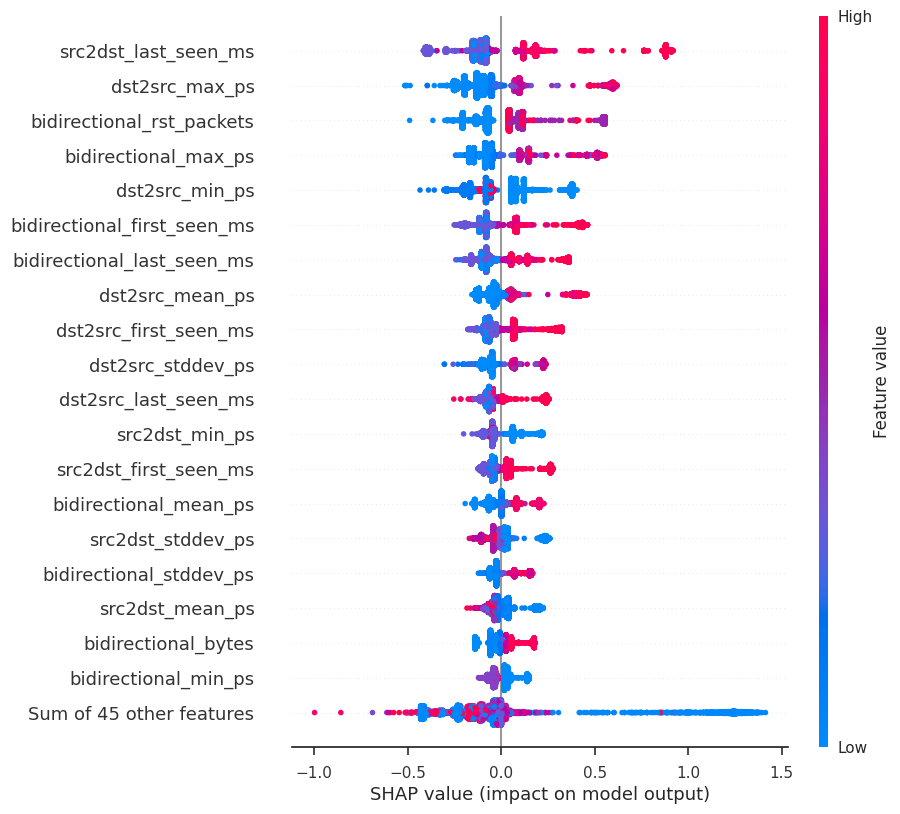

In [33]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## DoS GoldenEye shap

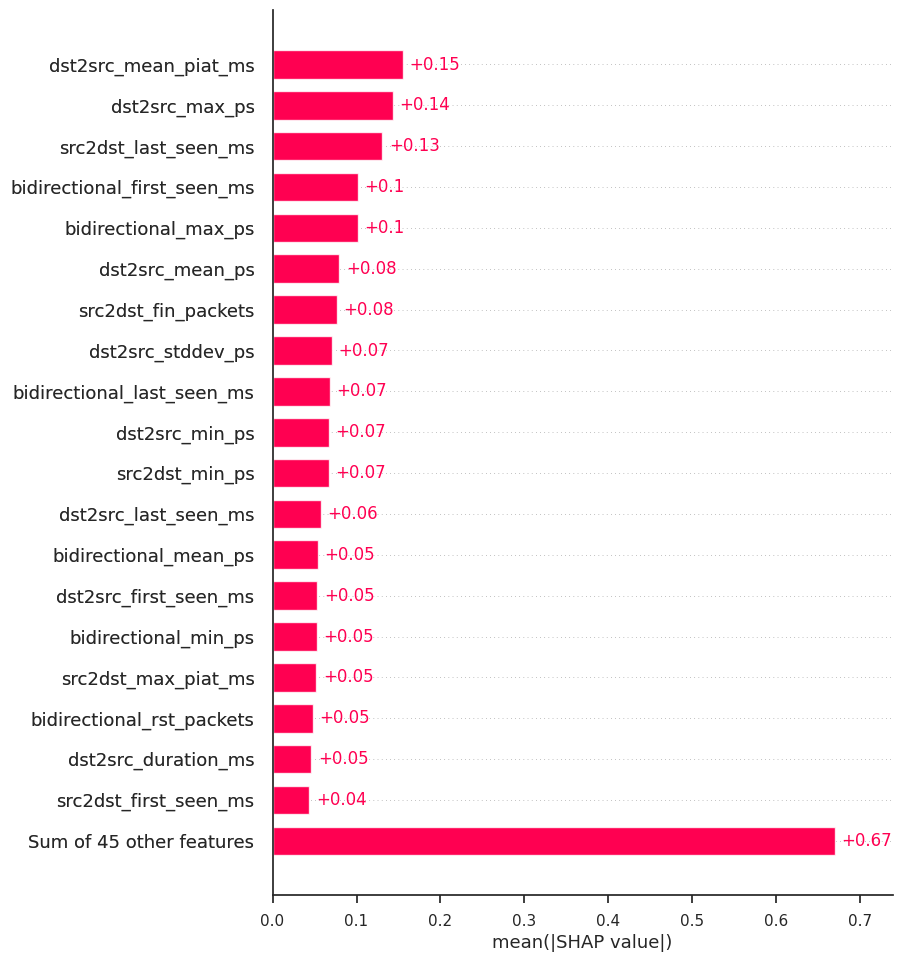

In [34]:
exp = Explanation(sv.values[:,:,3], 
                  sv.base_values[:,3], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

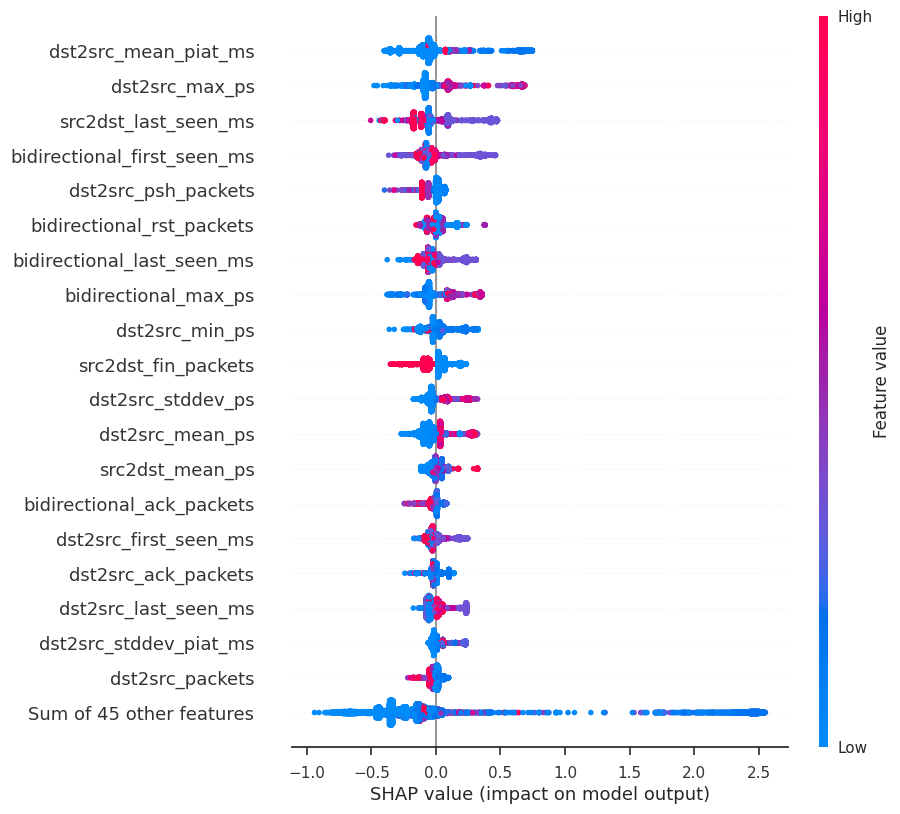

In [35]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

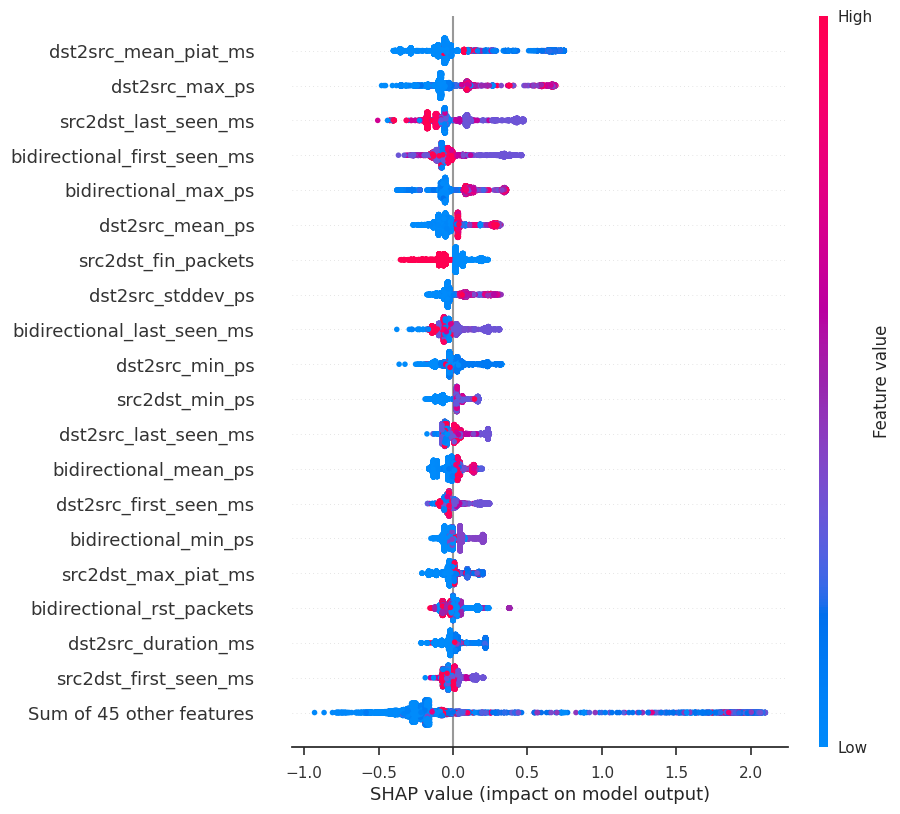

In [36]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## DoS Hulk shap

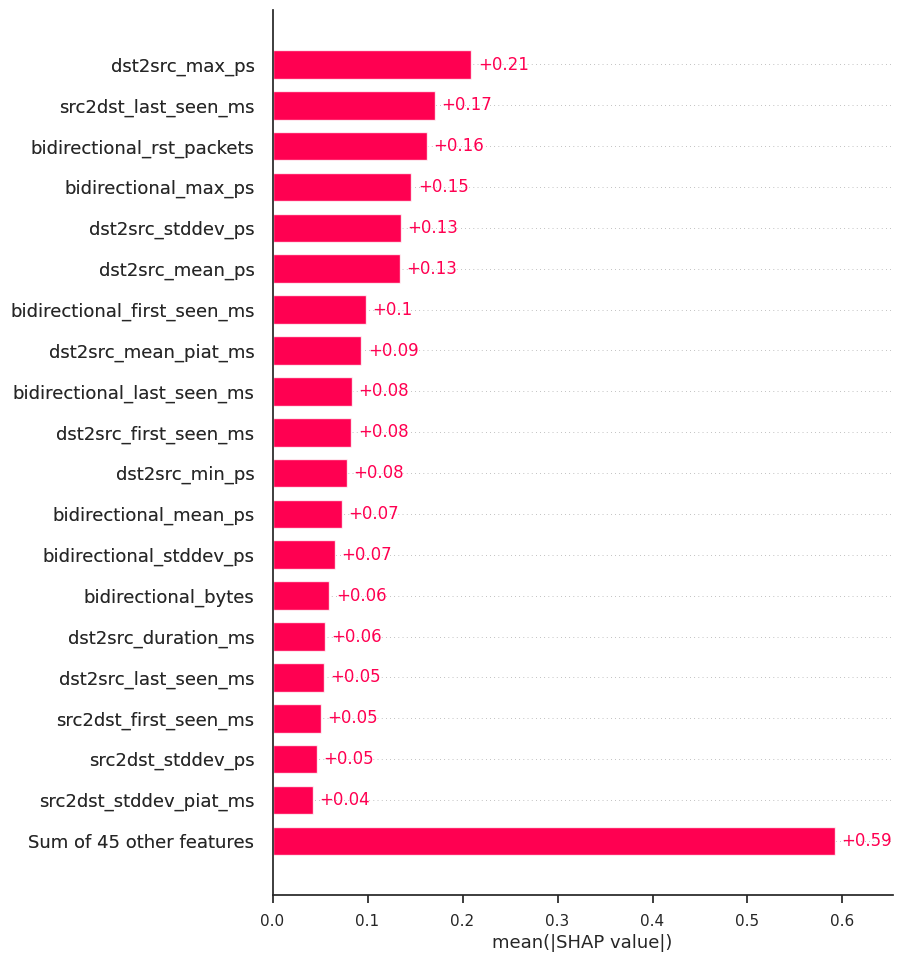

In [37]:
exp = Explanation(sv.values[:,:,4], 
                  sv.base_values[:,4], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

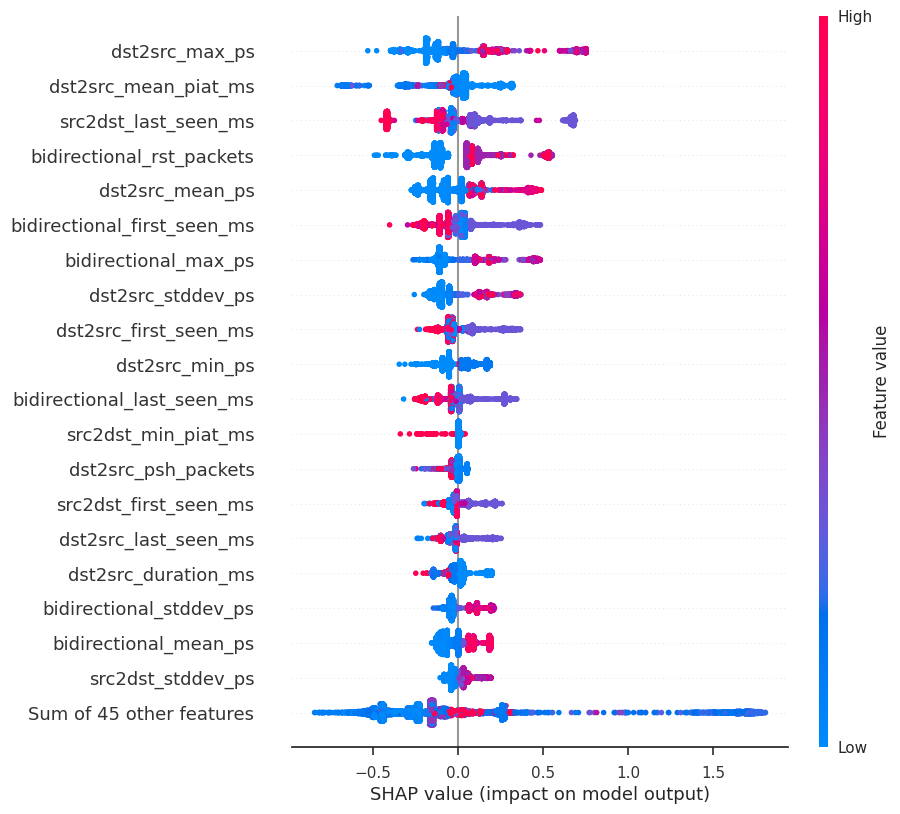

In [38]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

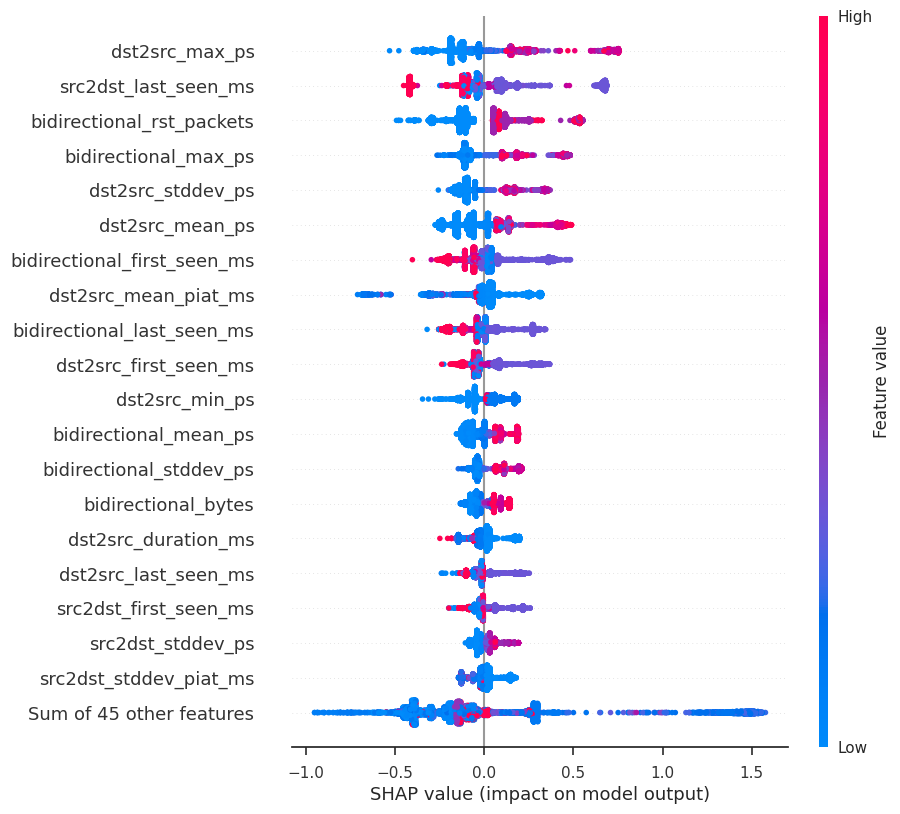

In [39]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## DoS Slowhttptest shap

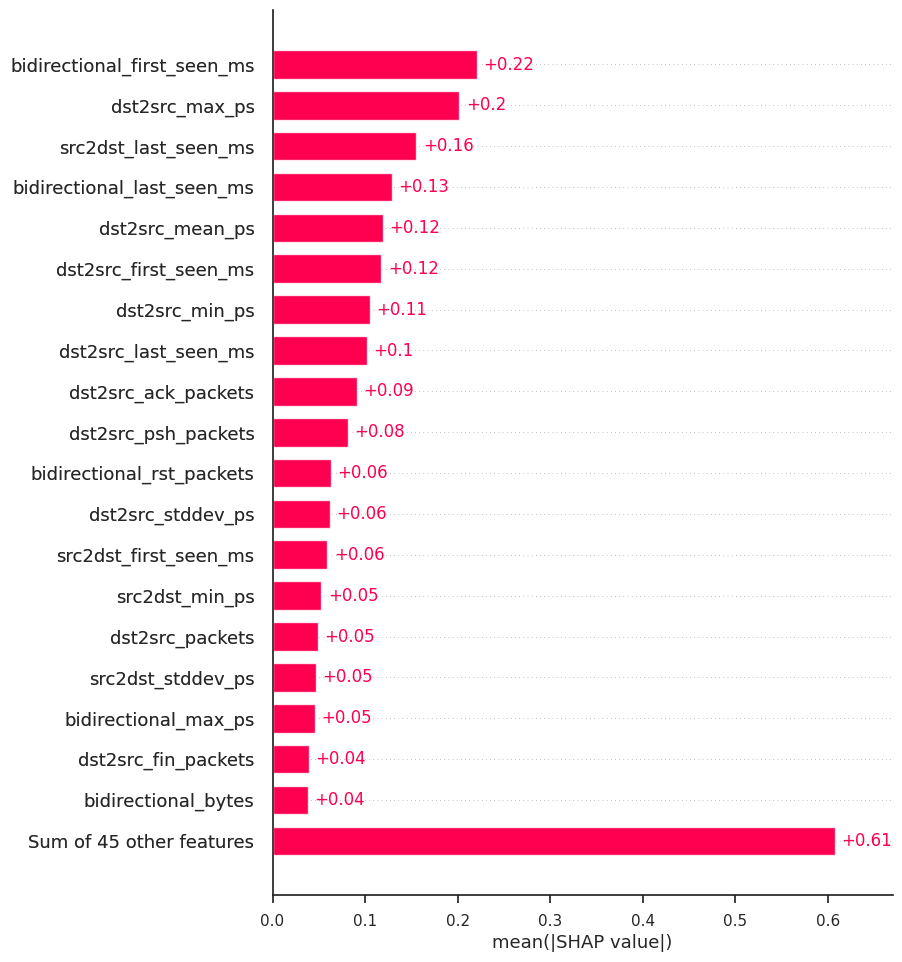

In [40]:
exp = Explanation(sv.values[:,:,5], 
                  sv.base_values[:,5], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

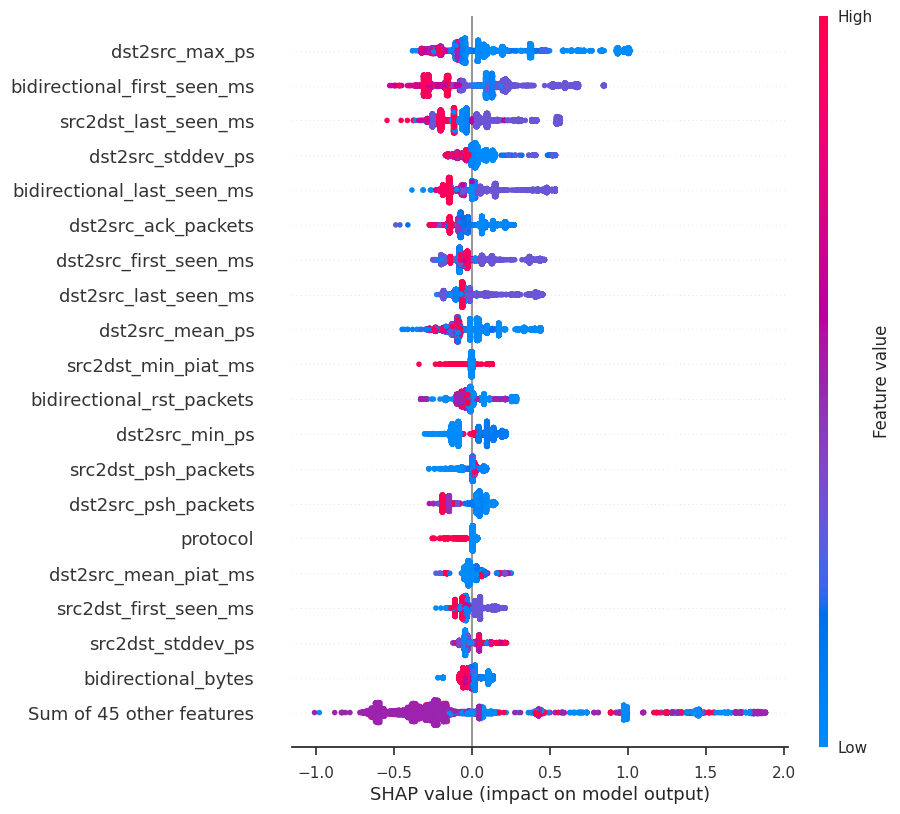

In [41]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

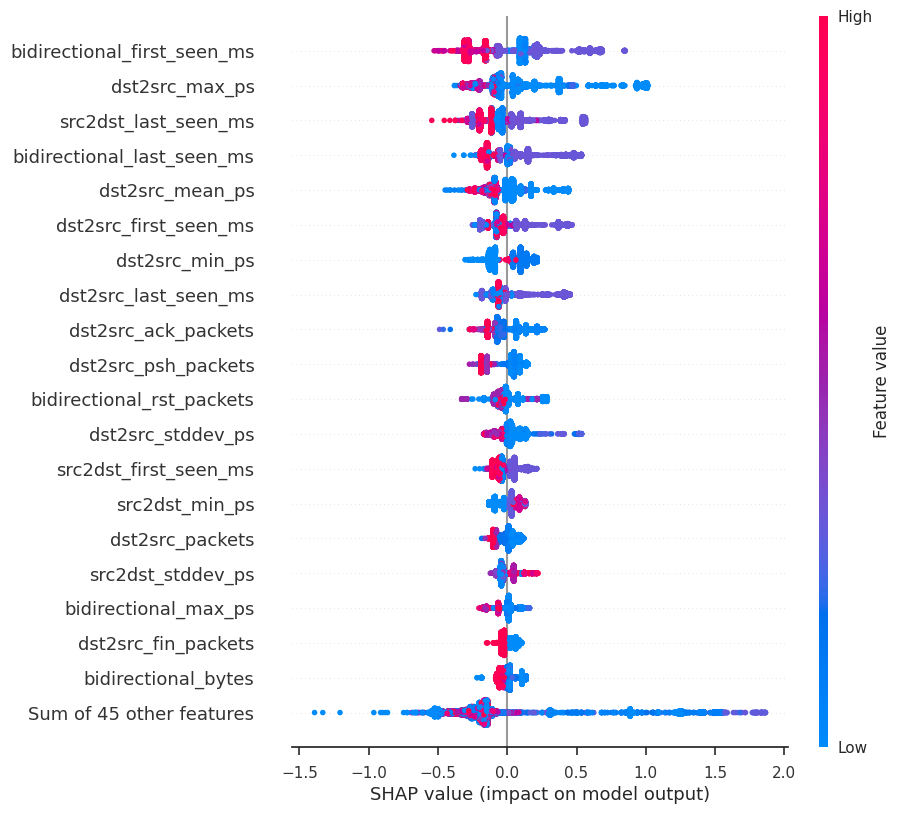

In [42]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## DoS slowloris shap

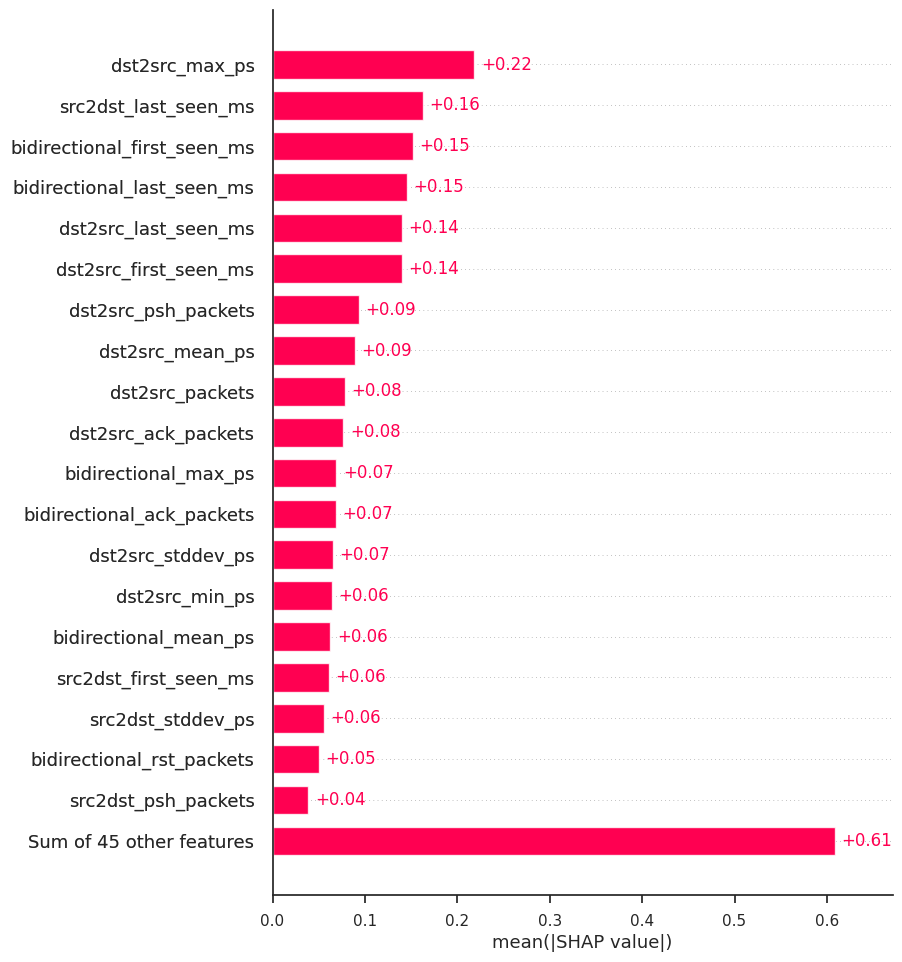

In [43]:
exp = Explanation(sv.values[:,:,6], 
                  sv.base_values[:,6], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

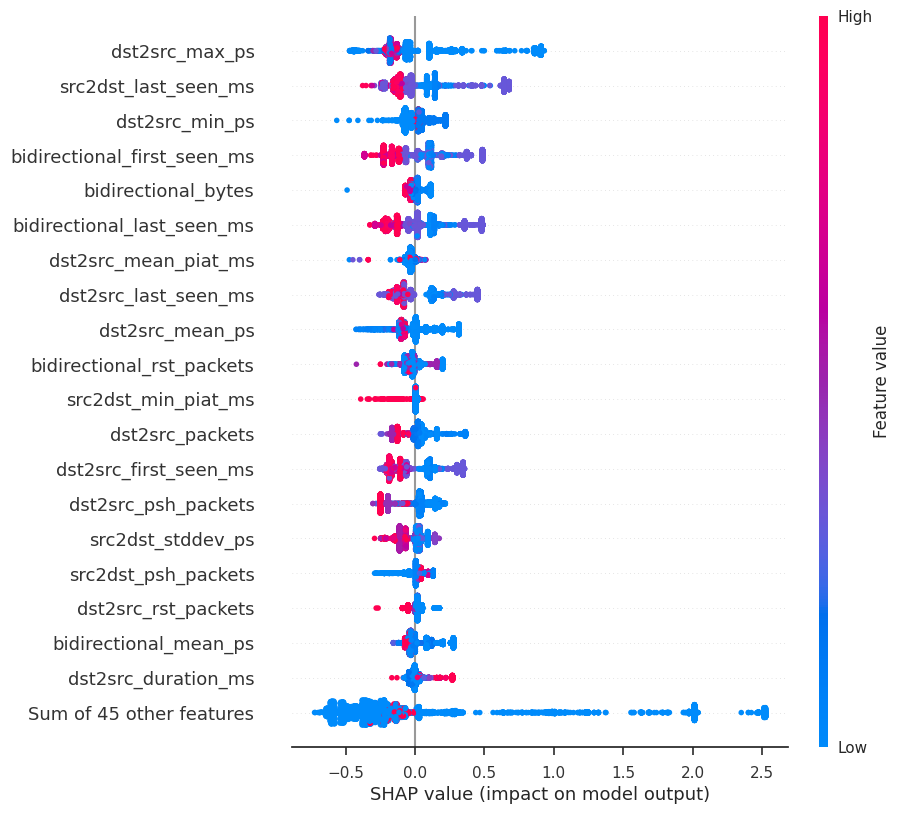

In [44]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

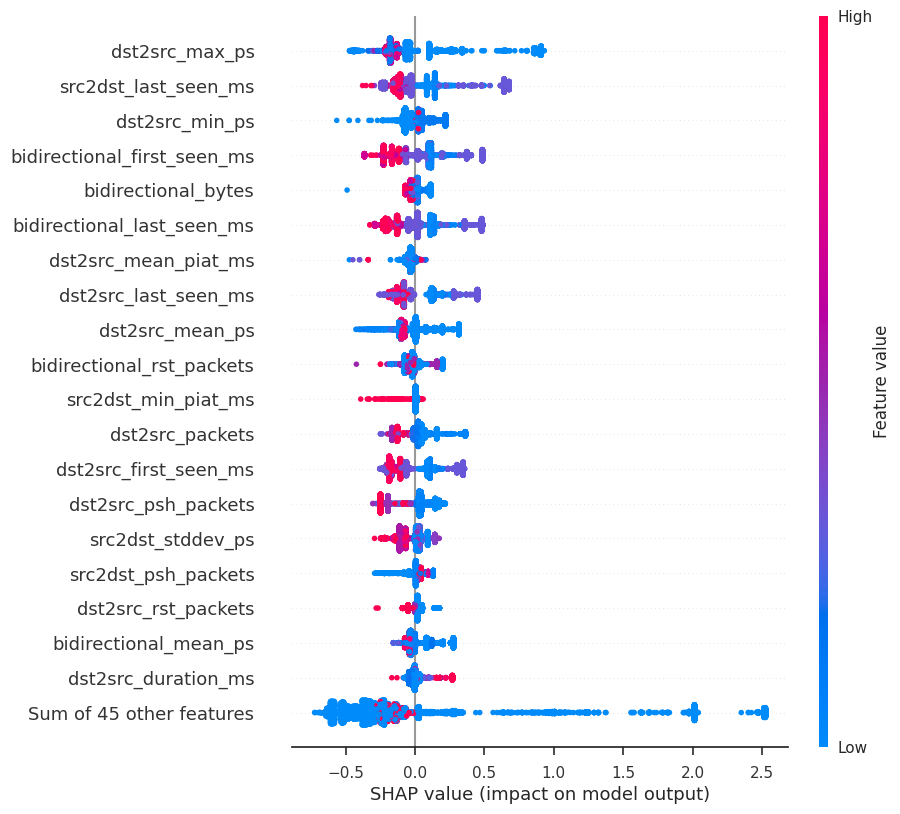

In [45]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

## FTP-Patator shap

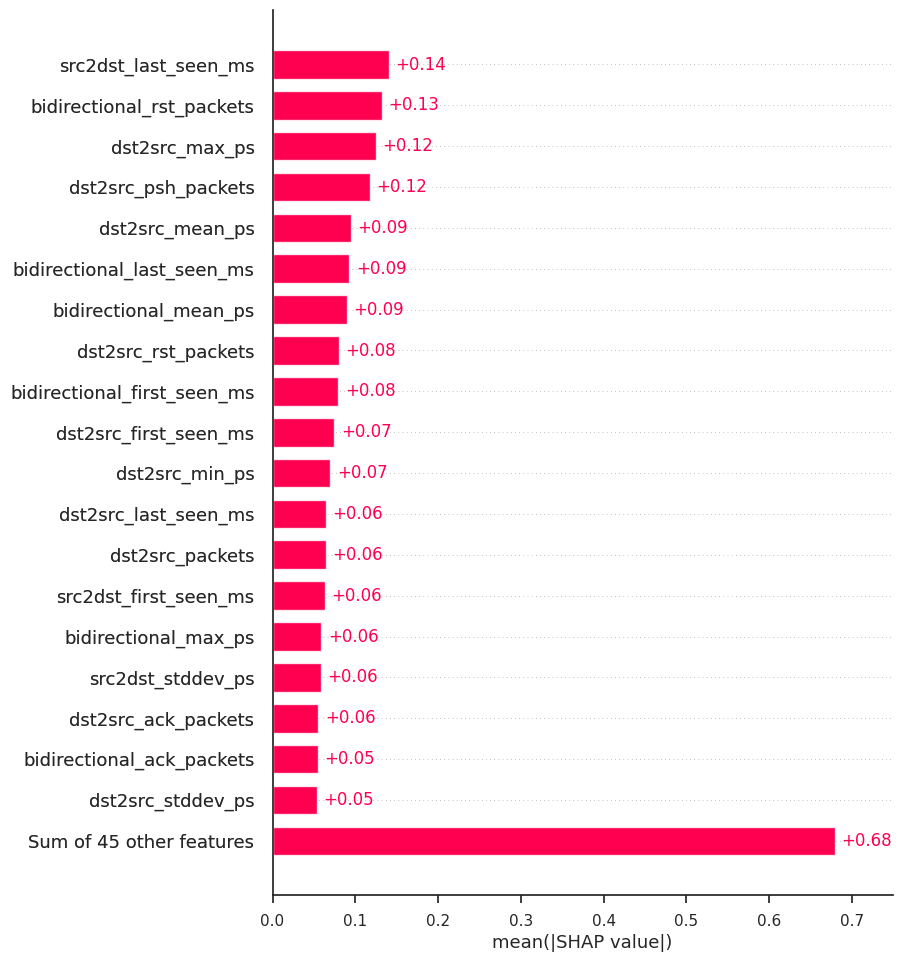

In [46]:
exp = Explanation(sv.values[:,:,7], 
                  sv.base_values[:,7], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

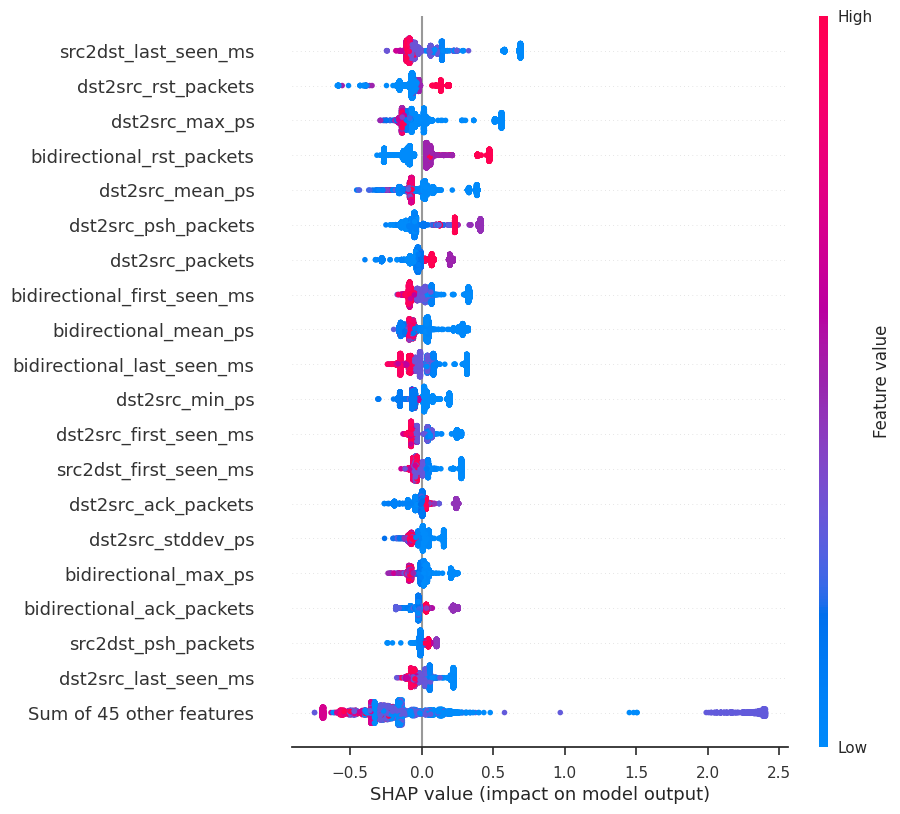

In [47]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

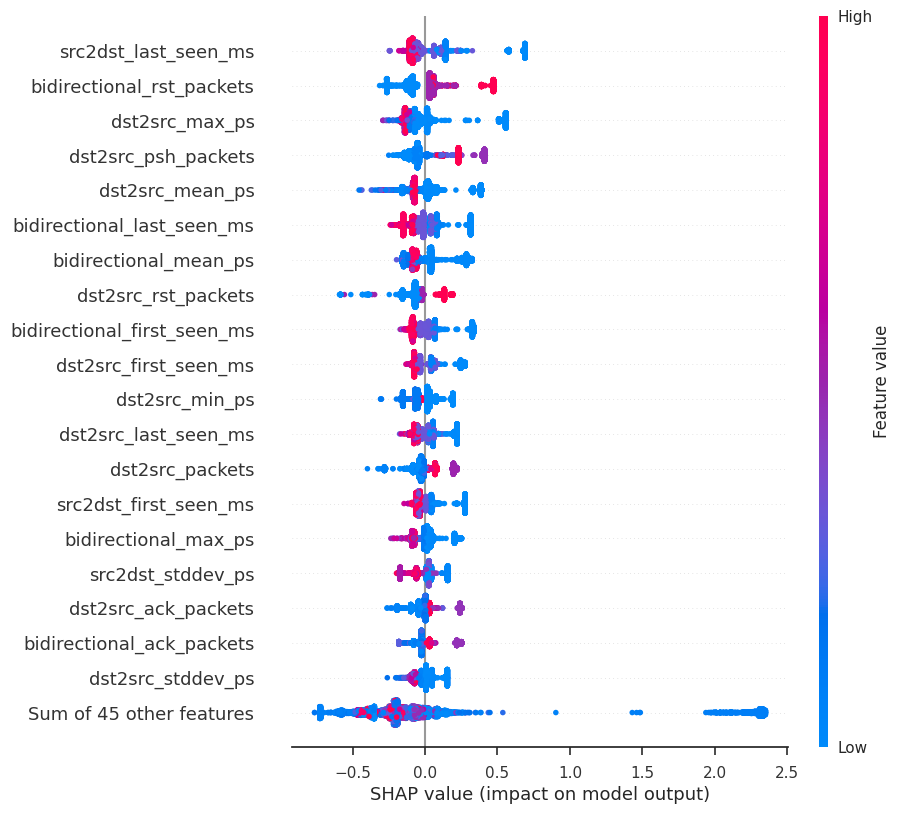

In [48]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Heartbleed shap

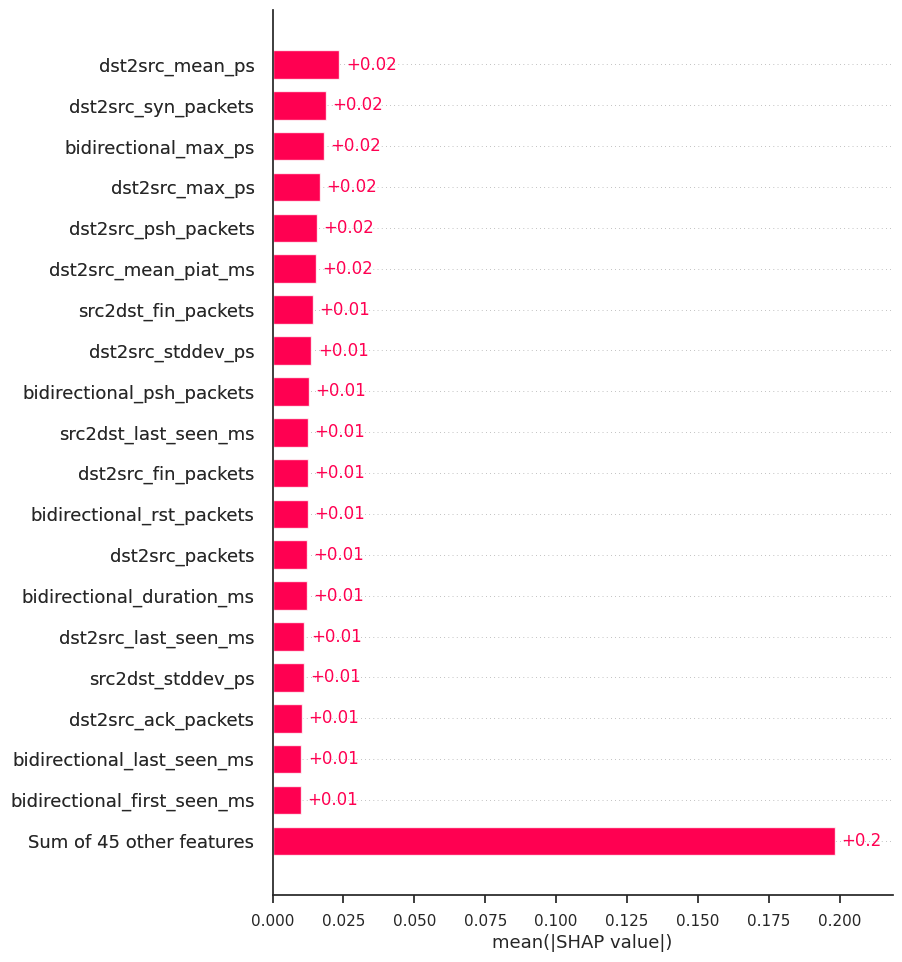

In [49]:
exp = Explanation(sv.values[:,:,8], 
                  sv.base_values[:,8], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

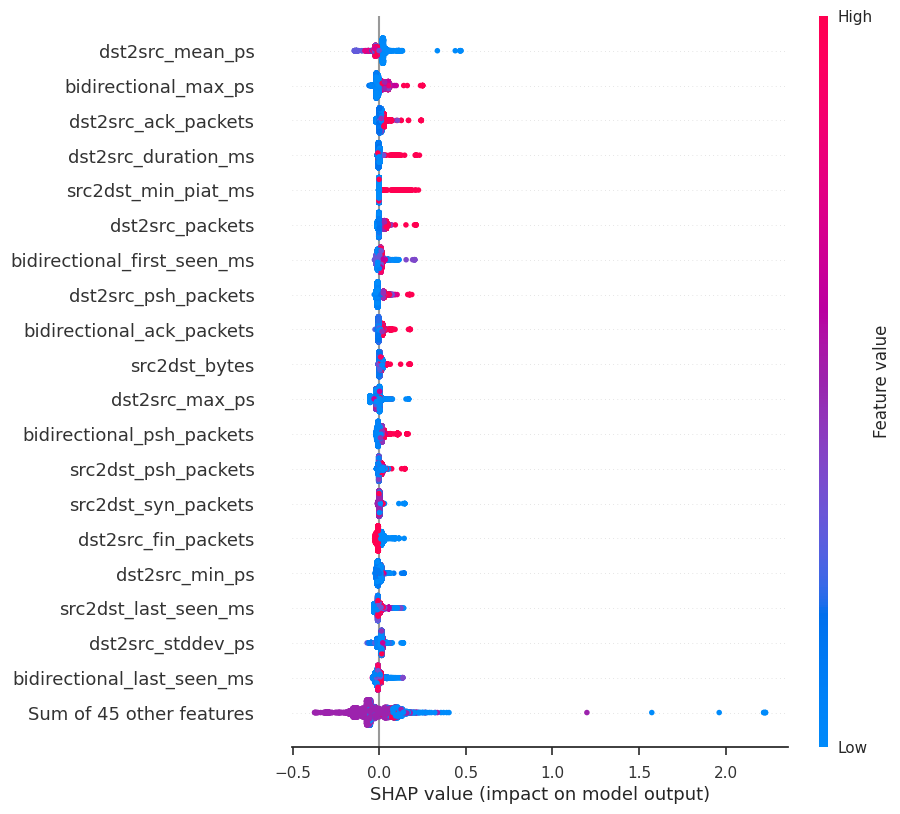

In [50]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

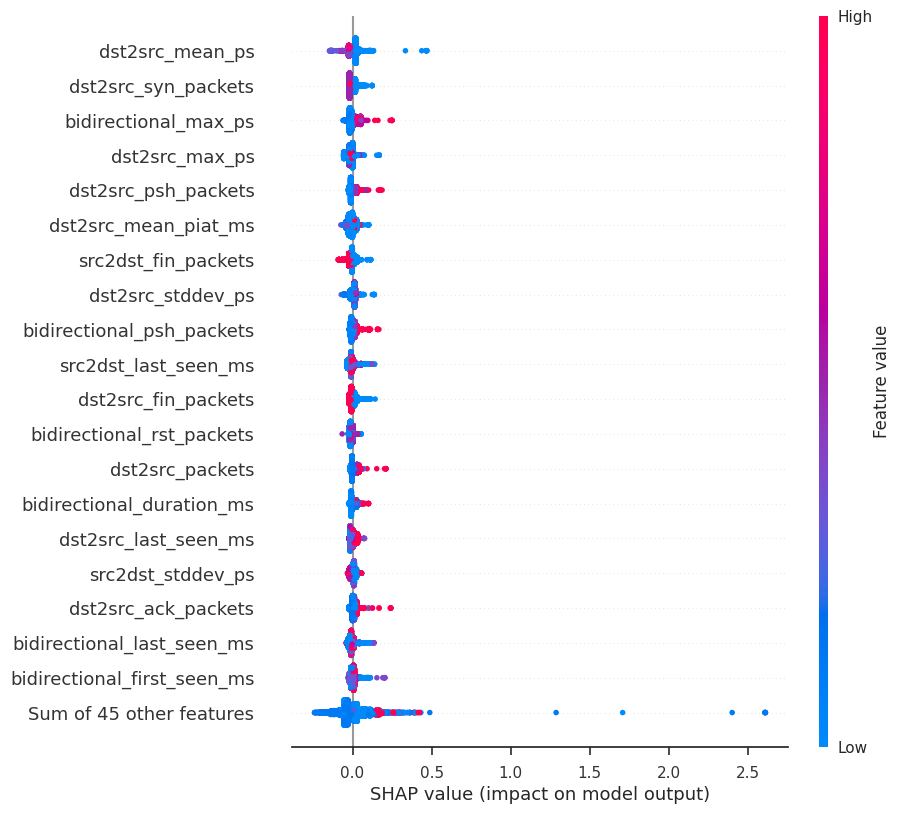

In [51]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Infiltration shap

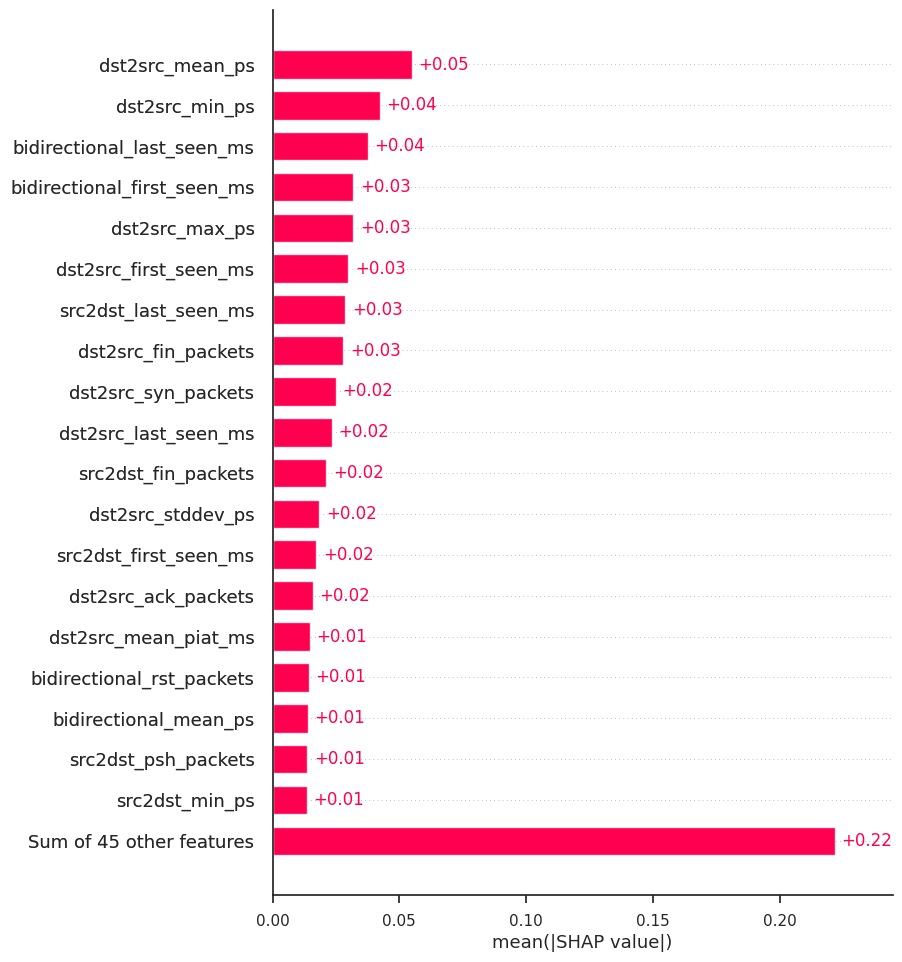

In [52]:
exp = Explanation(sv.values[:,:,9], 
                  sv.base_values[:,9], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

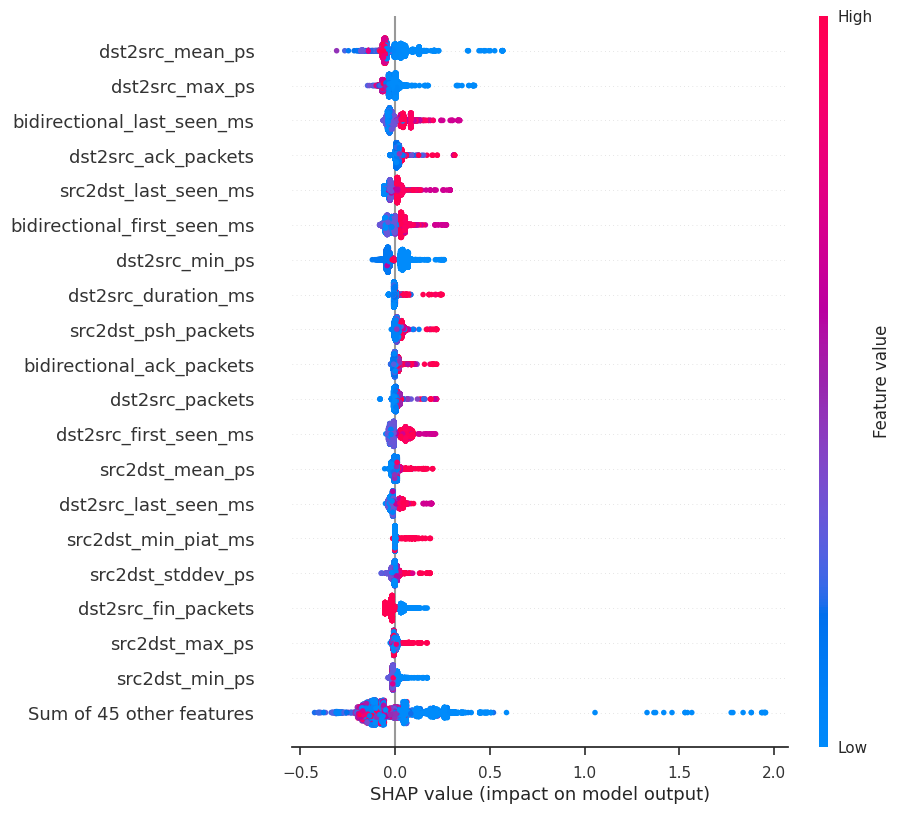

In [53]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

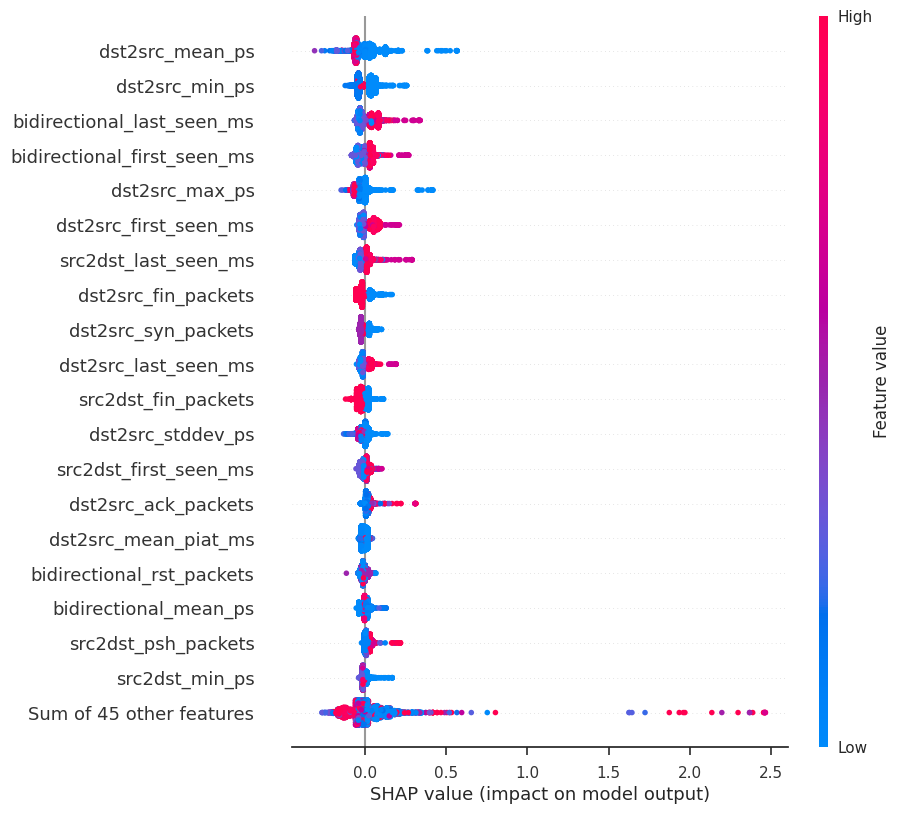

In [54]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## PortScan shap

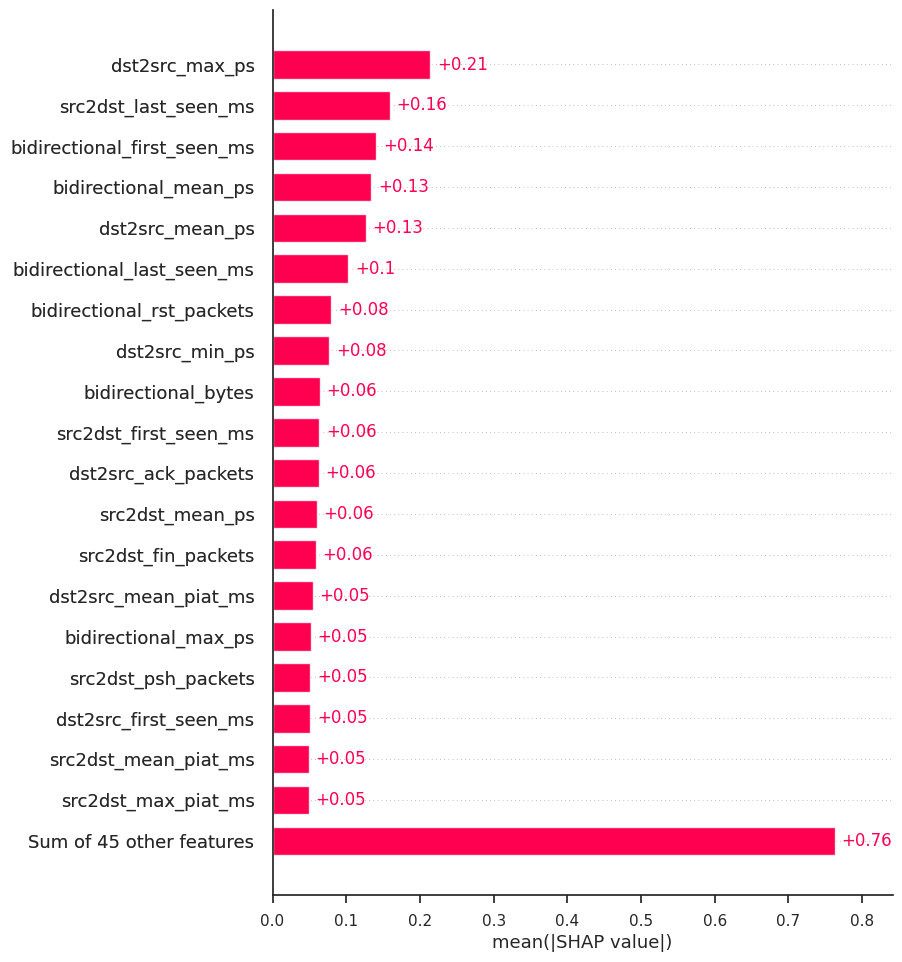

In [55]:
exp = Explanation(sv.values[:,:,10], 
                  sv.base_values[:,10], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

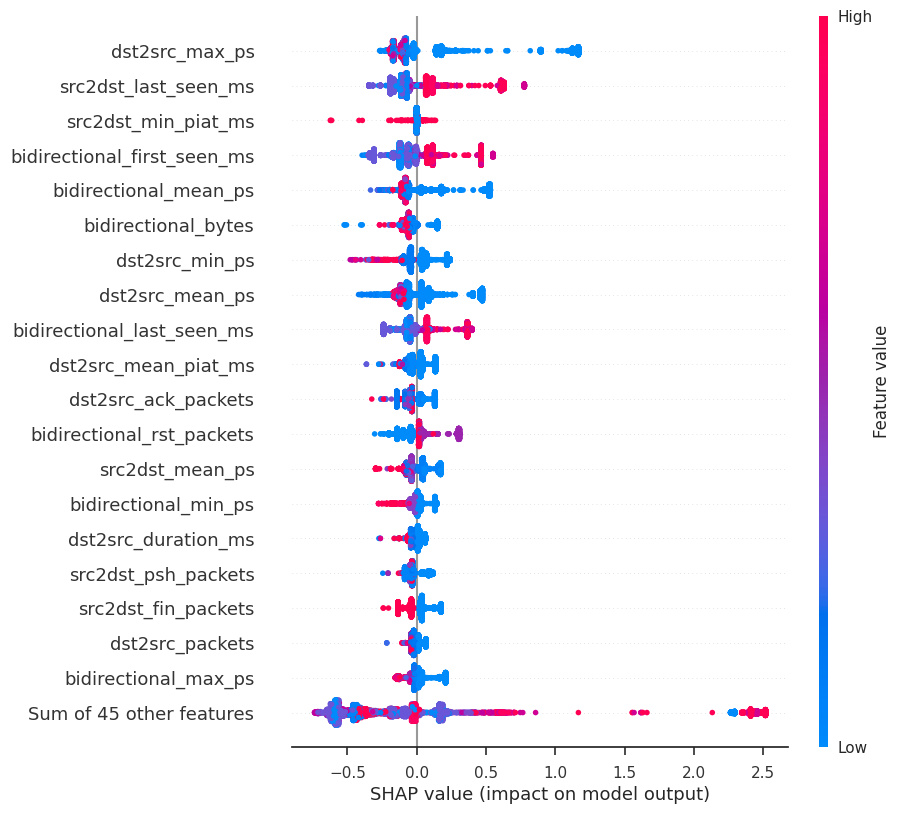

In [56]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

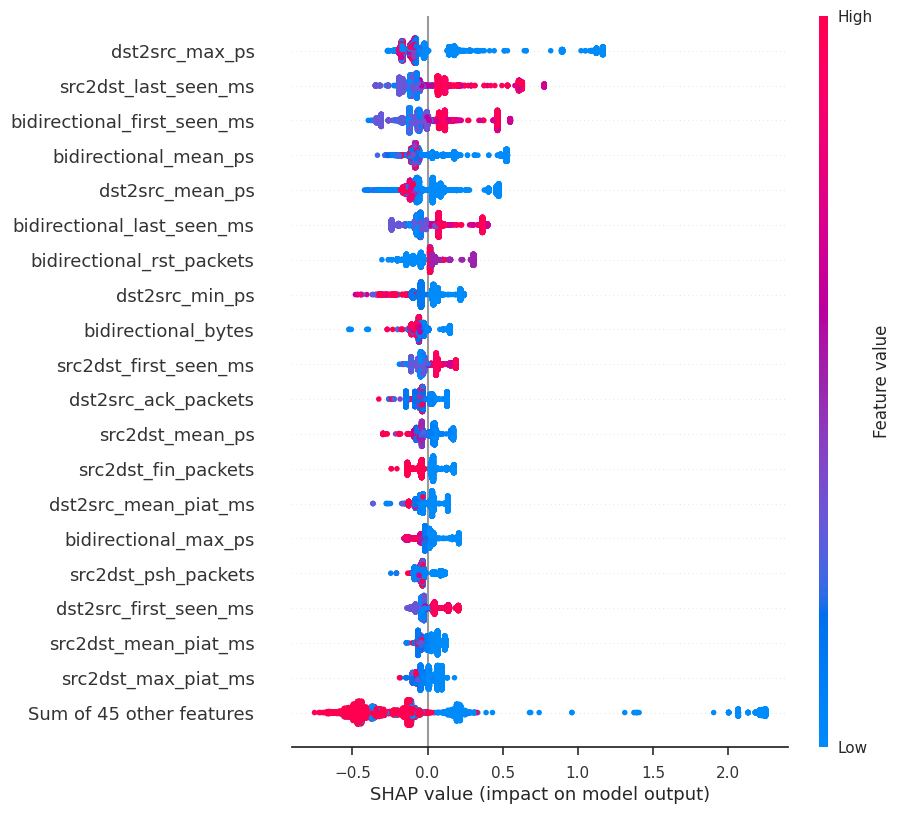

In [57]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## SSH-Patator shap

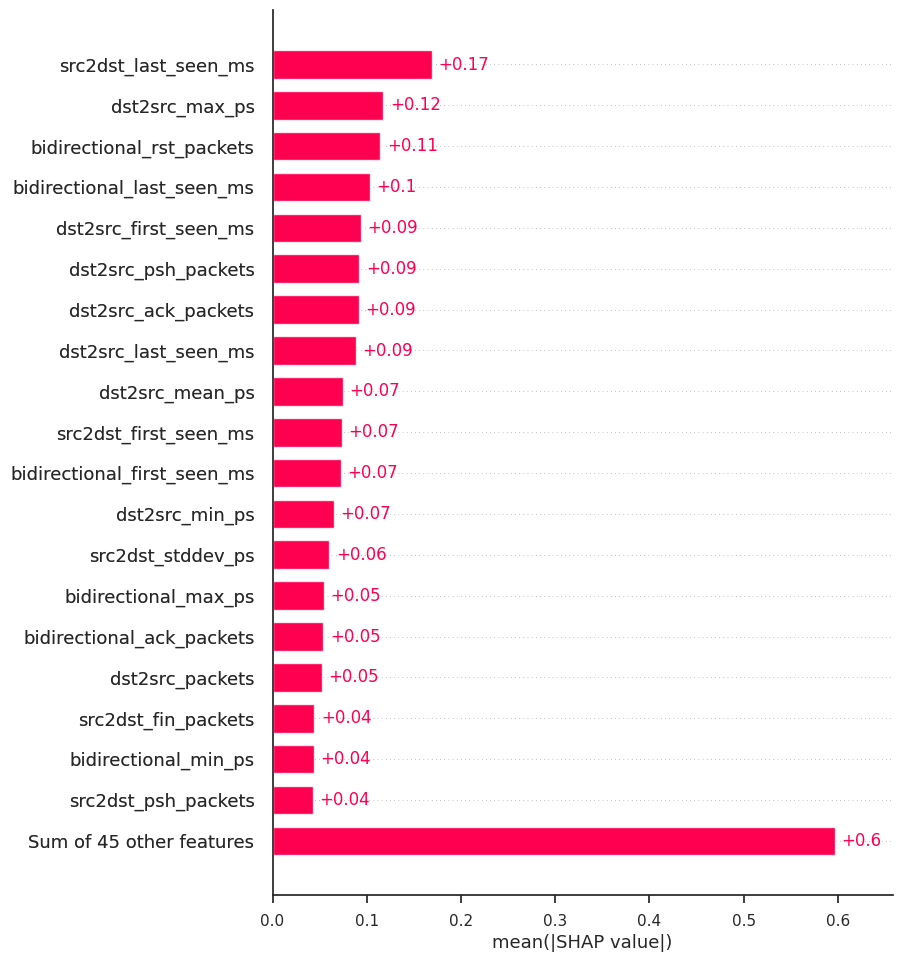

In [58]:
exp = Explanation(sv.values[:,:,11], 
                  sv.base_values[:,11], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

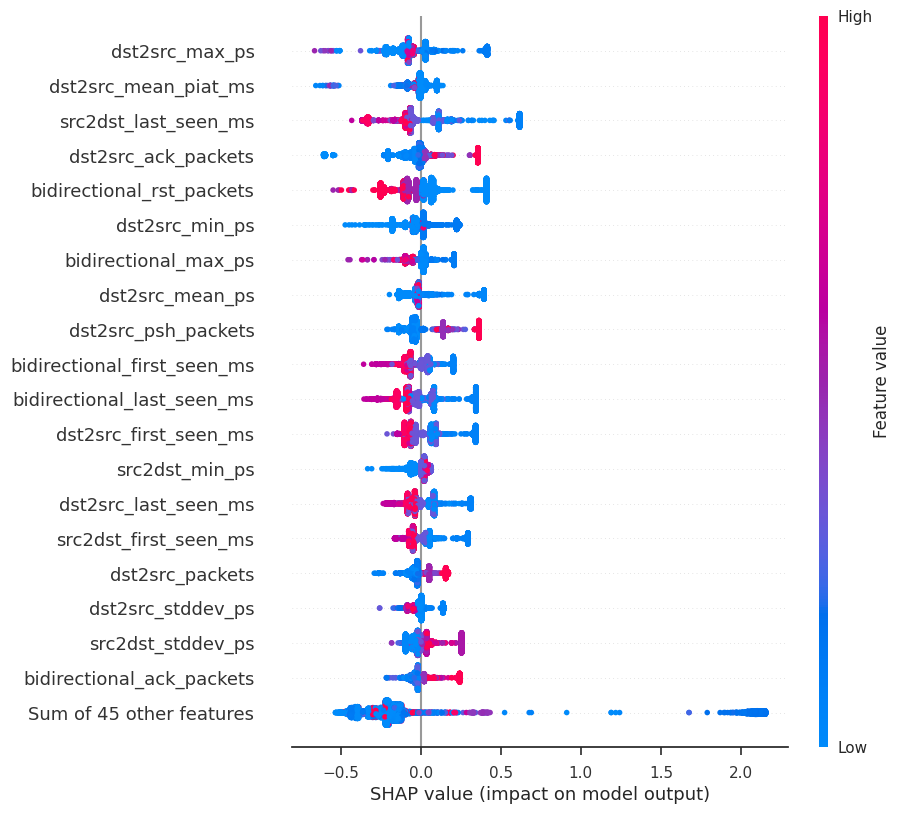

In [59]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

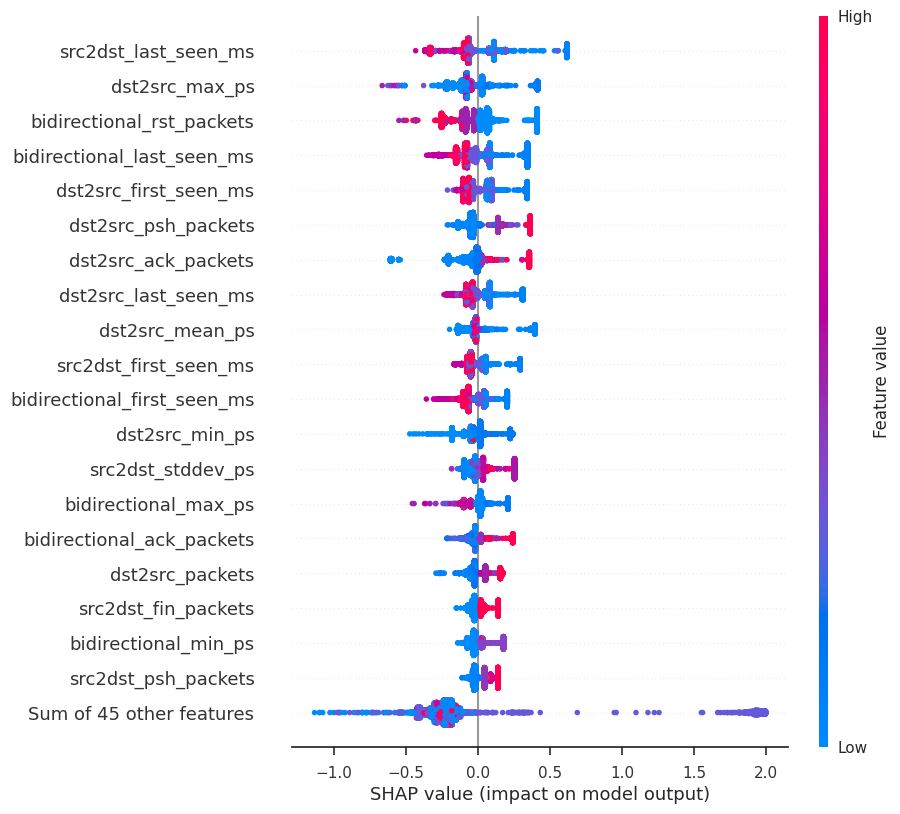

In [60]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Web Attack - Brute Force shap

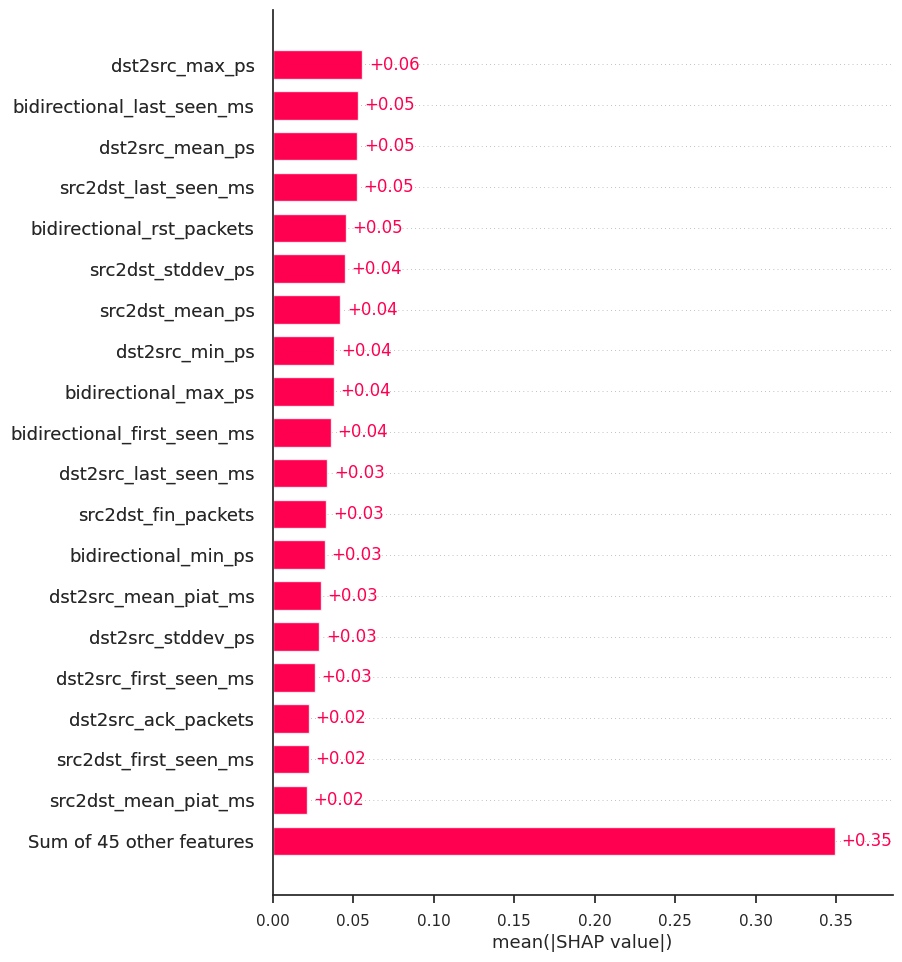

In [61]:
exp = Explanation(sv.values[:,:,12], 
                  sv.base_values[:,12], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

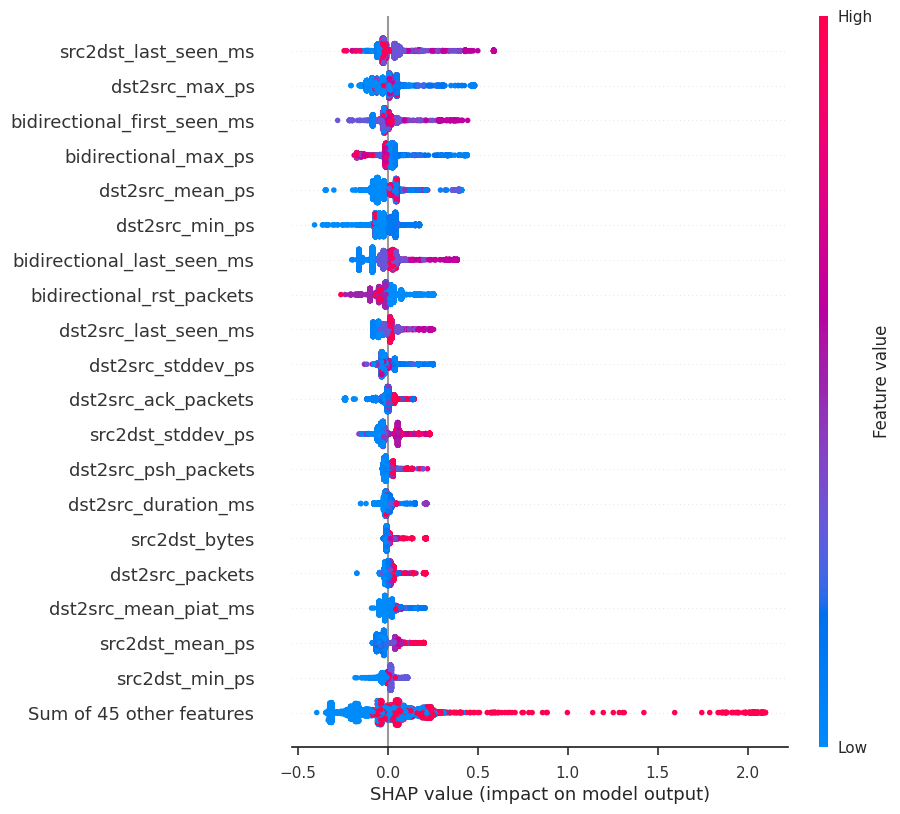

In [62]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

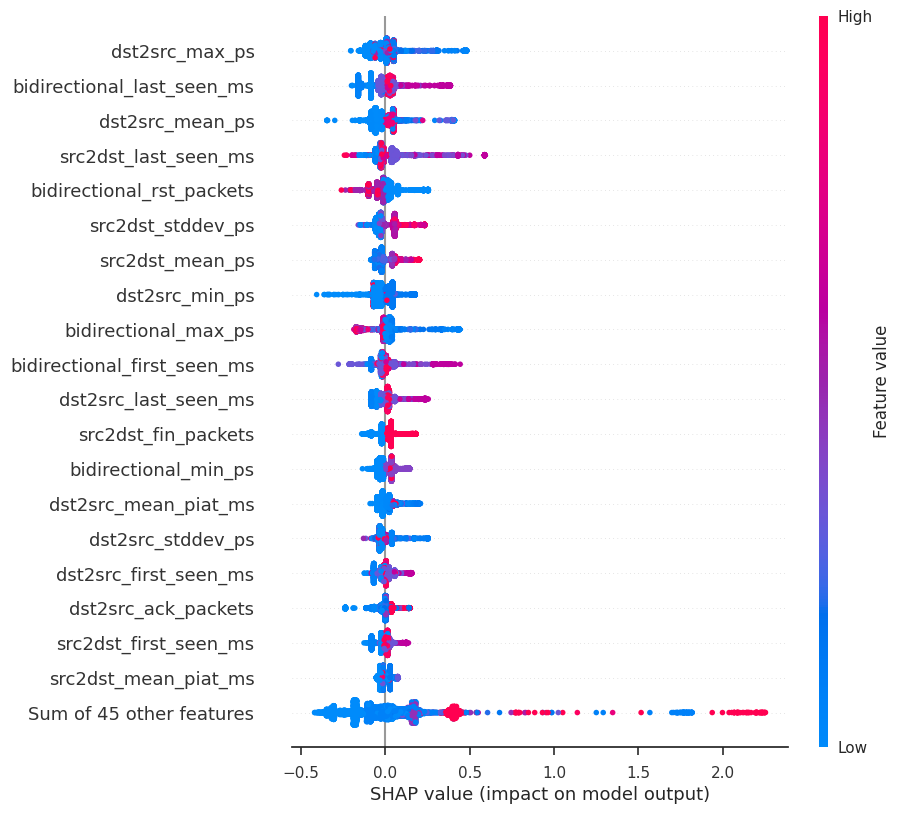

In [63]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Web Attack - Sql Injection shap

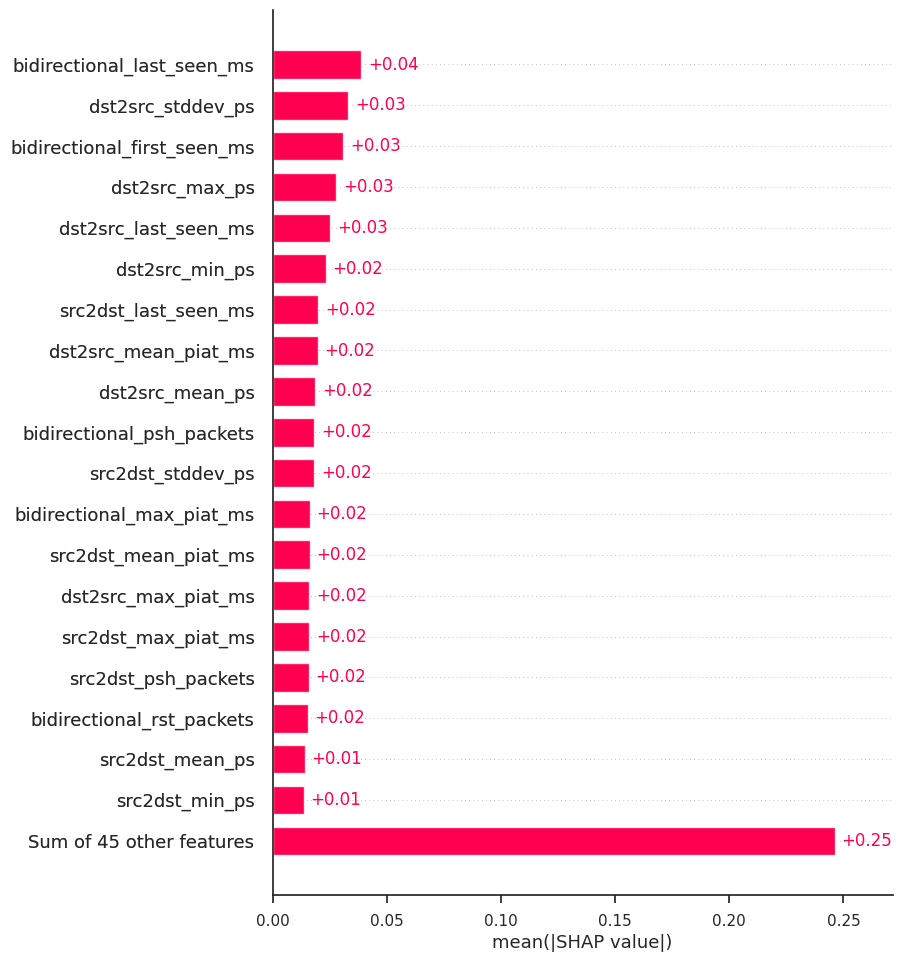

In [64]:
exp = Explanation(sv.values[:,:,13], 
                  sv.base_values[:,13], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

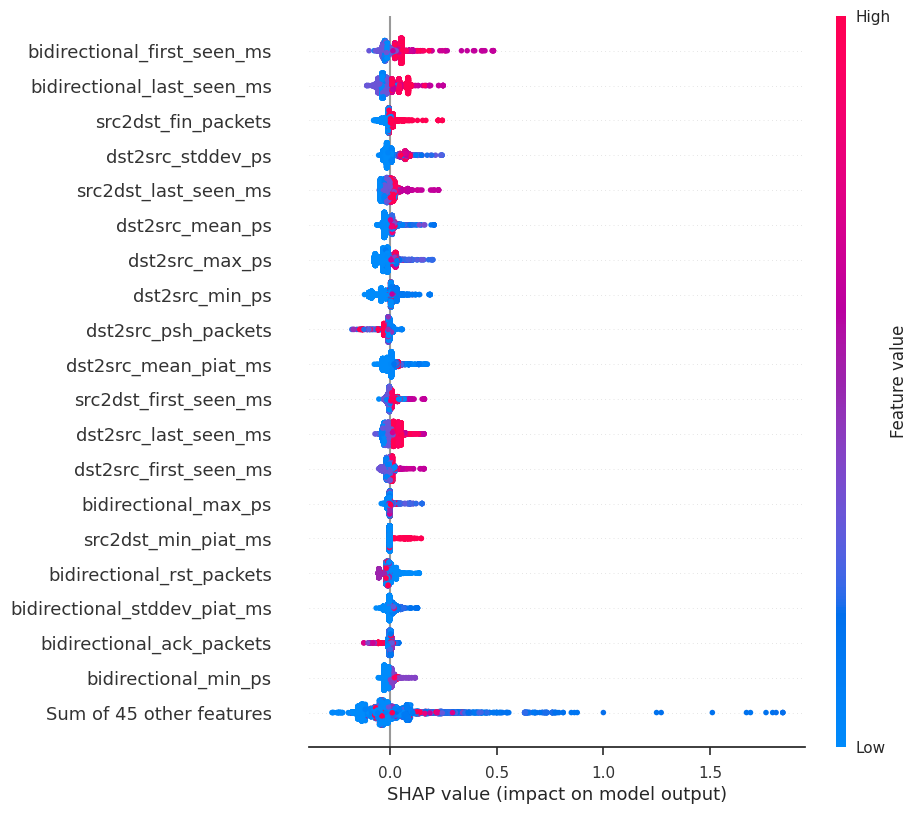

In [65]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

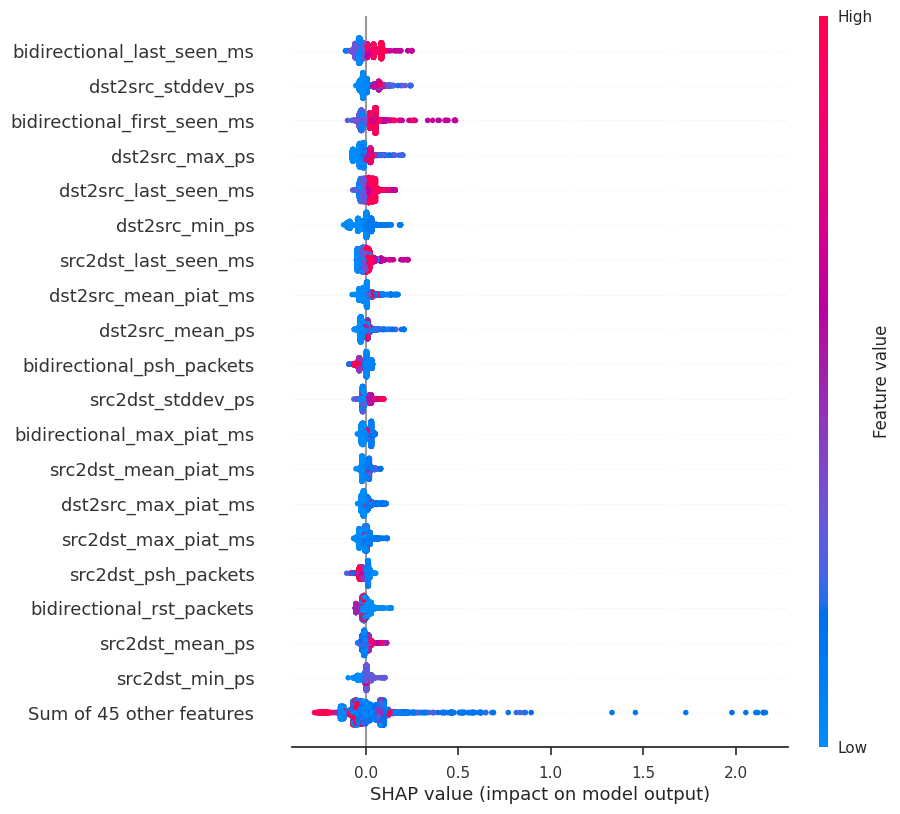

In [66]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Web Attack - XSS shap

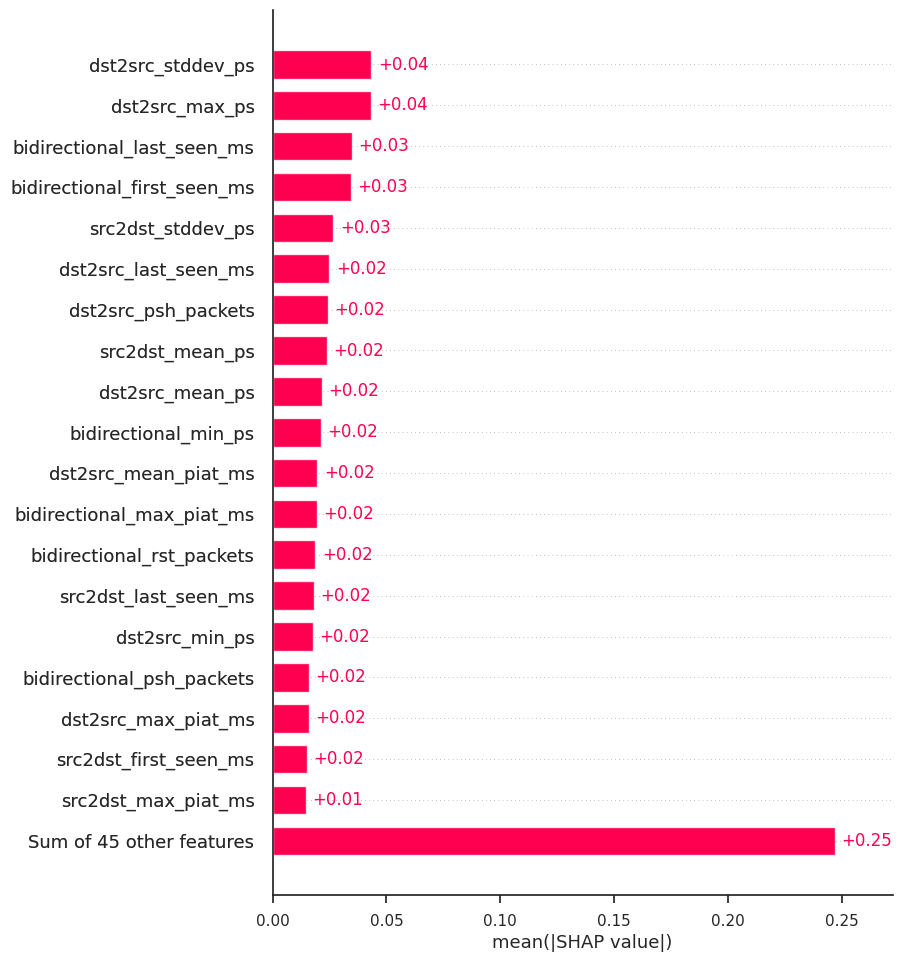

In [67]:
exp = Explanation(sv.values[:,:,14], 
                  sv.base_values[:,14], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

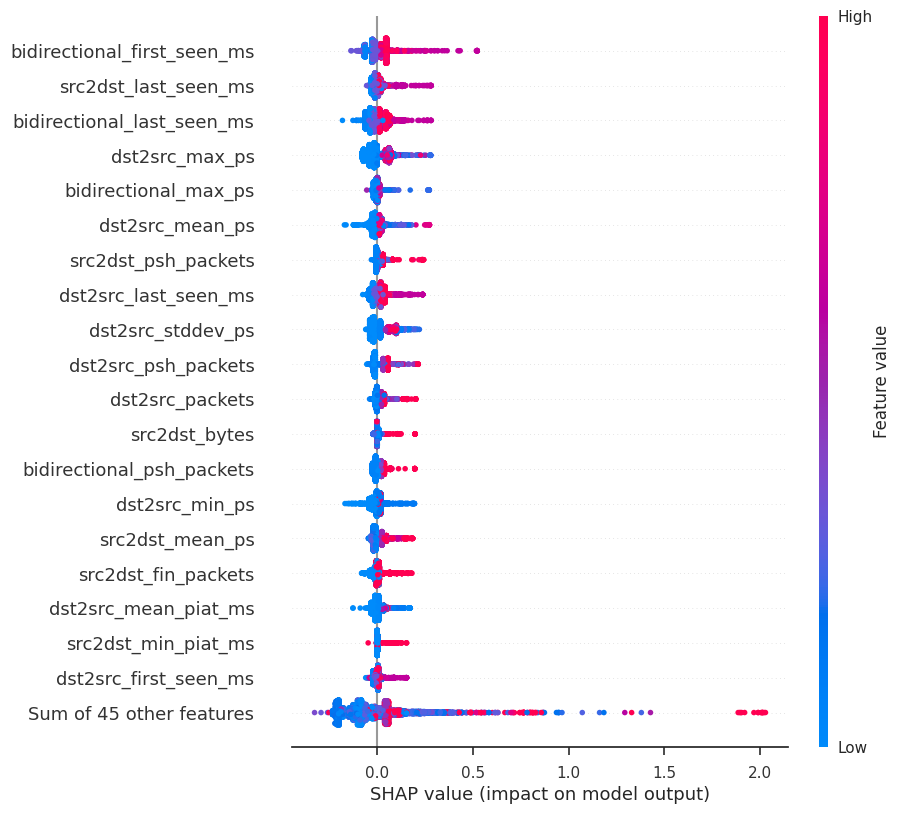

In [68]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

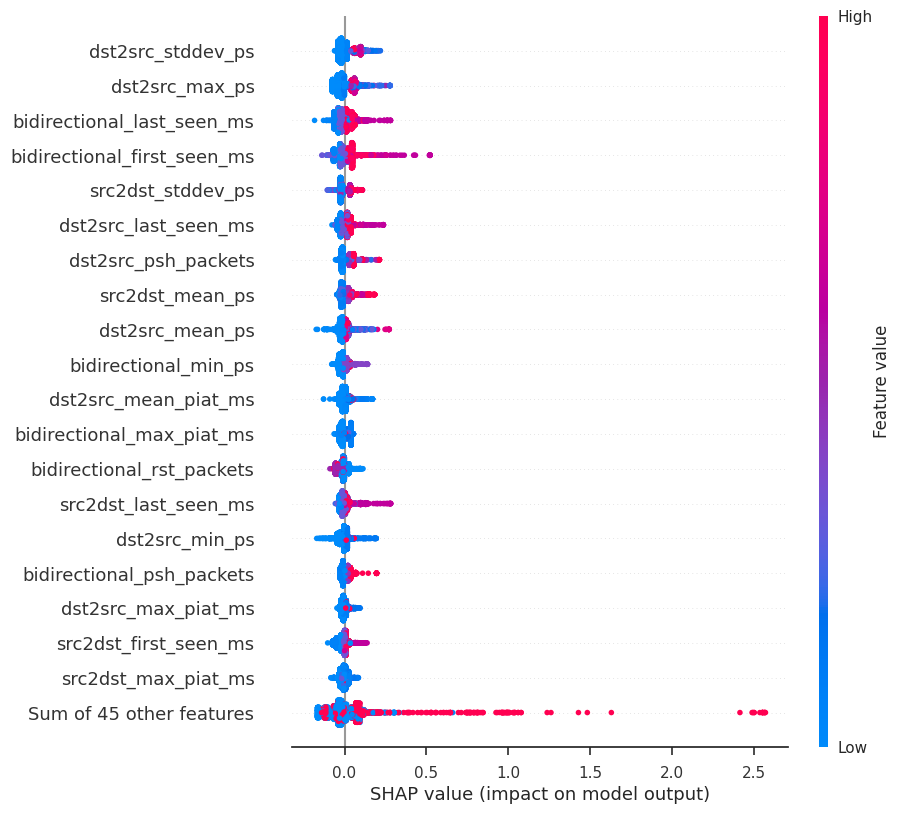

In [69]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Overall importance

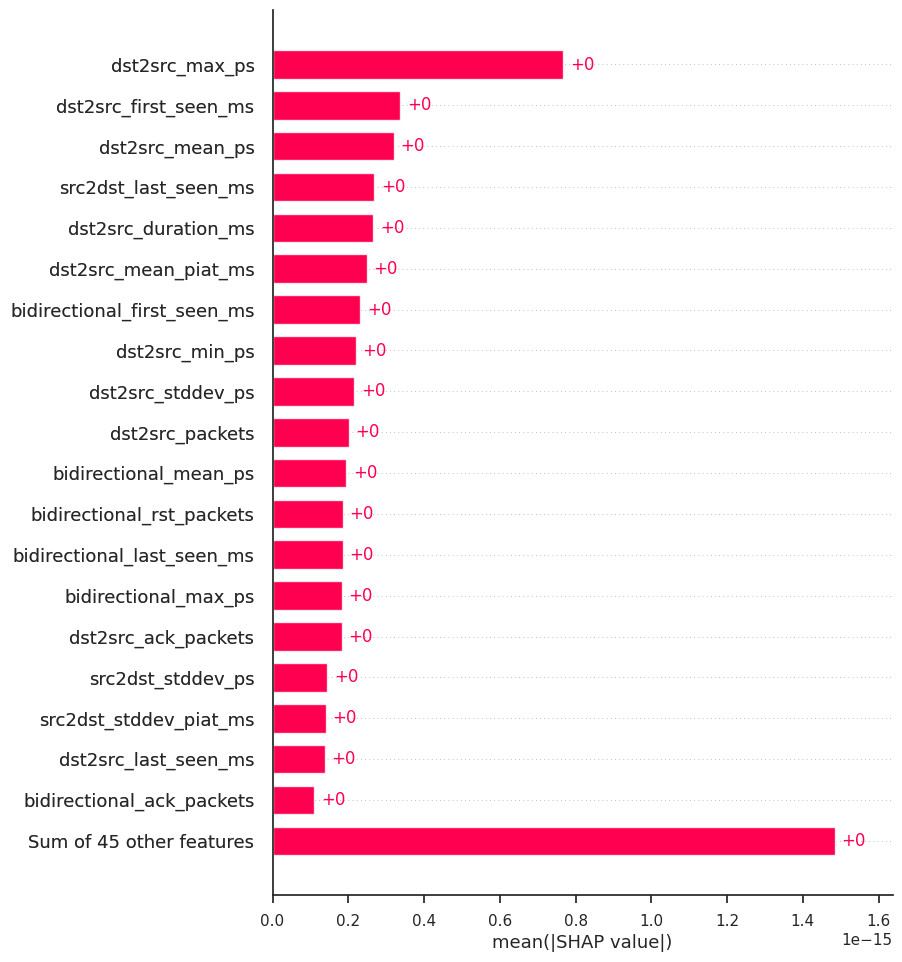

In [70]:
exp = Explanation(sv.values.mean(2), 
                  sv.base_values.mean(1), 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

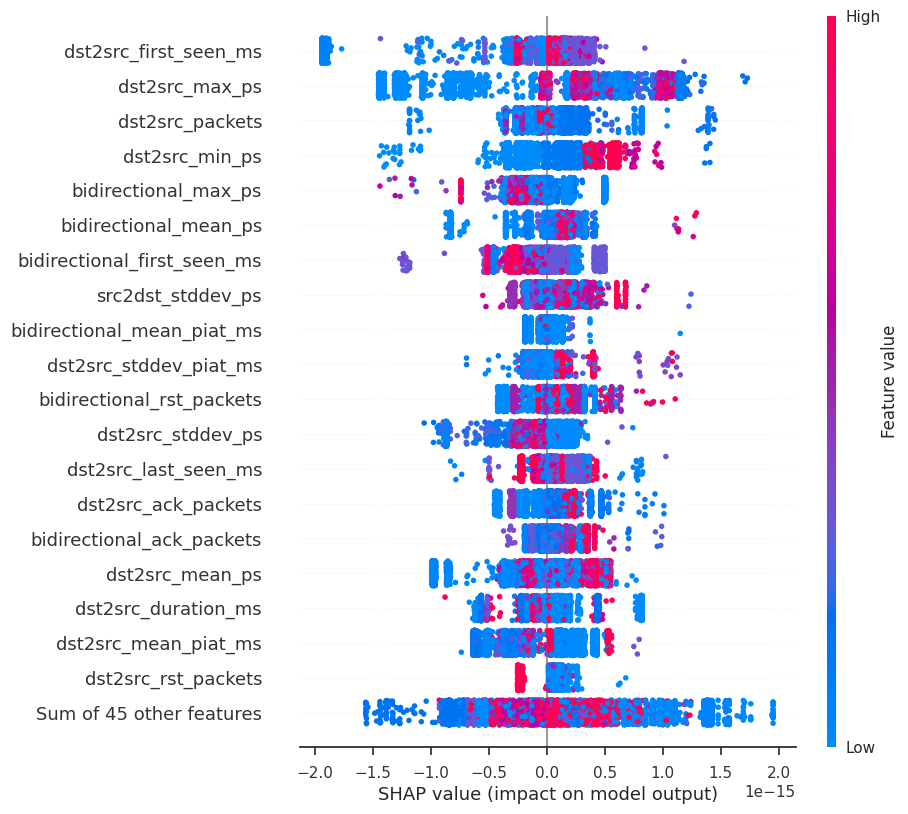

In [71]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

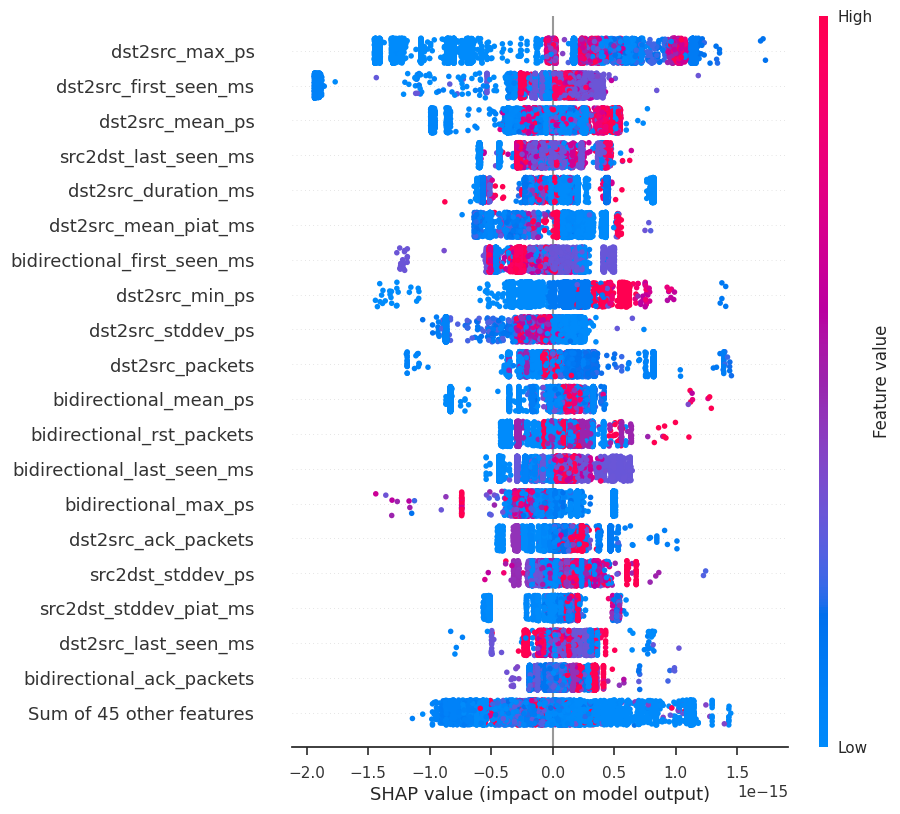

In [72]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Zero day test

In [73]:
classes = sorted(pd.unique(ds['label']).tolist())

In [74]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Bot']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7162351	total: 201ms	remaining: 15.9s
1:	learn: 1.3706836	total: 428ms	remaining: 16.7s
2:	learn: 1.1446493	total: 648ms	remaining: 16.6s
3:	learn: 0.9822199	total: 867ms	remaining: 16.5s
4:	learn: 0.8541767	total: 1.09s	remaining: 16.4s
5:	learn: 0.7535561	total: 1.32s	remaining: 16.3s
6:	learn: 0.6661480	total: 1.55s	remaining: 16.2s
7:	learn: 0.5934153	total: 1.78s	remaining: 16s
8:	learn: 0.5328985	total: 2.02s	remaining: 16s
9:	learn: 0.4821300	total: 2.24s	remaining: 15.7s
10:	learn: 0.4352855	total: 2.47s	remaining: 15.5s
11:	learn: 0.3940922	total: 2.7s	remaining: 15.3s
12:	learn: 0.3586142	total: 2.93s	remaining: 15.1s
13:	learn: 0.3274538	total: 3.16s	remaining: 14.9s
14:	learn: 0.3004102	total: 3.38s	remaining: 14.7s
15:	learn: 0.2750129	total: 3.61s	remaining: 14.5s
16:	learn: 0.2532901	total: 3.83s	remaining: 14.2s
17:	learn: 0.2327439	total: 4.06s	remaining: 14s
18:	learn: 0.2154341	total: 4.29s	remaining: 13.8s
19:	learn: 0.1996154	total: 4.53s	remaining: 13.

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.997999,0.895532
1,PRECISION,0.998003,0.849584
2,RECALL,0.997999,0.895532
3,F1 SCORE,0.997978,0.863971


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


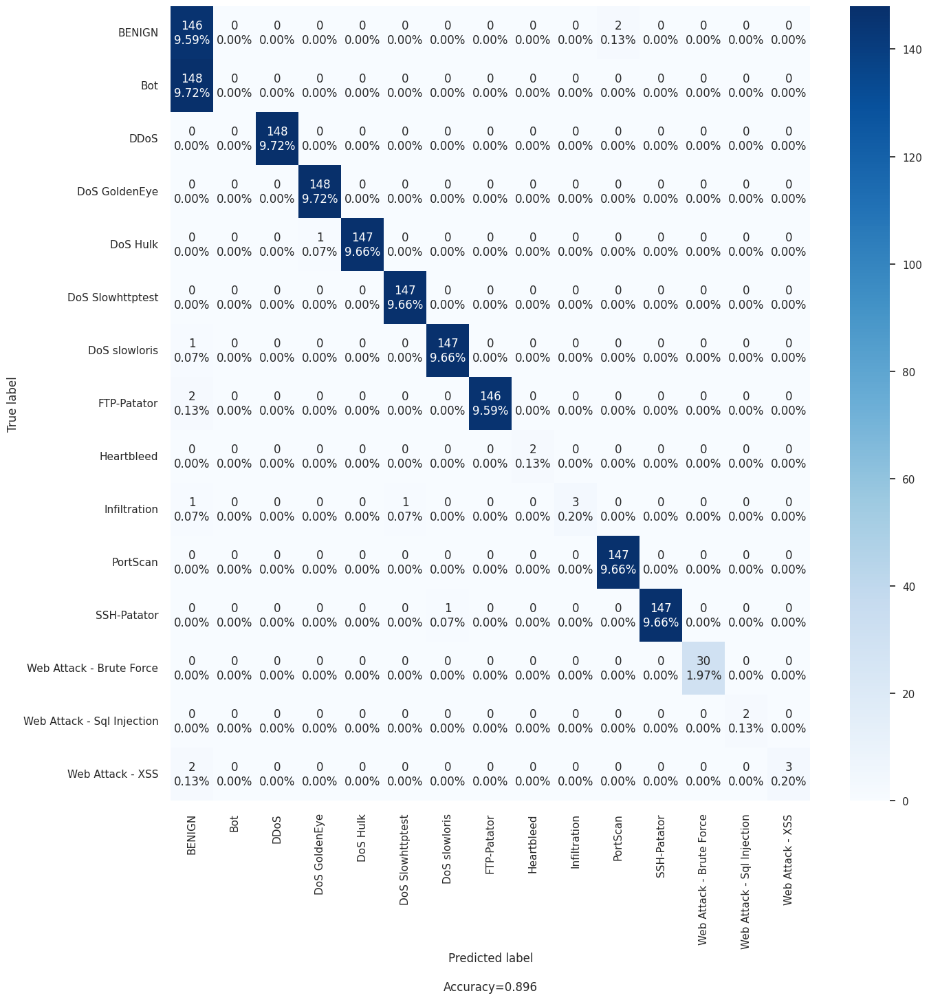

In [75]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [76]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DDoS']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.6973463	total: 258ms	remaining: 20.4s
1:	learn: 1.3632117	total: 503ms	remaining: 19.6s
2:	learn: 1.1474241	total: 733ms	remaining: 18.8s
3:	learn: 0.9849278	total: 968ms	remaining: 18.4s
4:	learn: 0.8565280	total: 1.2s	remaining: 18s
5:	learn: 0.7555648	total: 1.44s	remaining: 17.7s
6:	learn: 0.6695647	total: 1.66s	remaining: 17.4s
7:	learn: 0.5972286	total: 1.9s	remaining: 17.1s
8:	learn: 0.5386917	total: 2.14s	remaining: 16.9s
9:	learn: 0.4890096	total: 2.38s	remaining: 16.7s
10:	learn: 0.4423067	total: 2.62s	remaining: 16.4s
11:	learn: 0.3990506	total: 2.84s	remaining: 16.1s
12:	learn: 0.3636361	total: 3.07s	remaining: 15.8s
13:	learn: 0.3324479	total: 3.31s	remaining: 15.6s
14:	learn: 0.3040105	total: 3.53s	remaining: 15.3s
15:	learn: 0.2782286	total: 3.76s	remaining: 15s
16:	learn: 0.2564161	total: 4s	remaining: 14.8s
17:	learn: 0.2360837	total: 4.23s	remaining: 14.6s
18:	learn: 0.2180131	total: 4.46s	remaining: 14.3s
19:	learn: 0.2015206	total: 4.7s	remaining: 14.1s


Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.998180,0.895532
1,PRECISION,0.998184,0.847967
2,RECALL,0.998180,0.895532
3,F1 SCORE,0.998166,0.863354


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


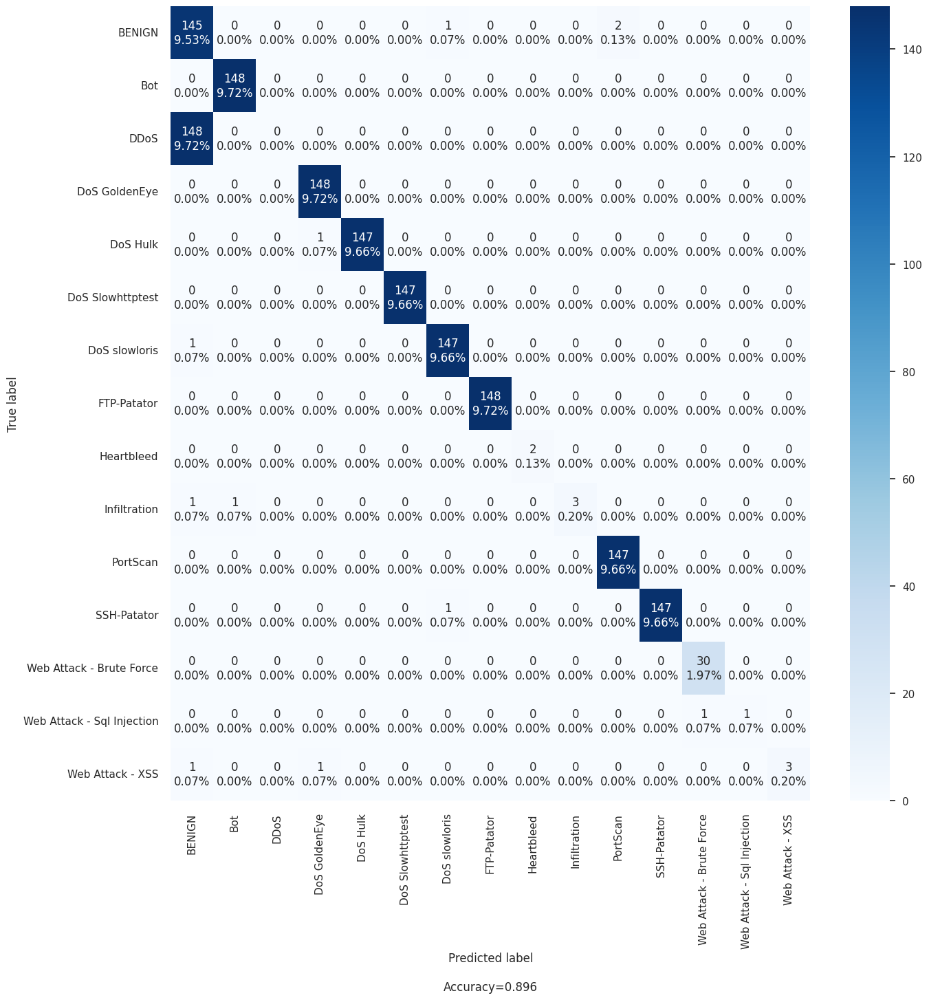

In [77]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [78]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS GoldenEye']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7335765	total: 210ms	remaining: 16.6s
1:	learn: 1.3800156	total: 448ms	remaining: 17.5s
2:	learn: 1.1556873	total: 682ms	remaining: 17.5s
3:	learn: 0.9893978	total: 916ms	remaining: 17.4s
4:	learn: 0.8600464	total: 1.16s	remaining: 17.3s
5:	learn: 0.7543178	total: 1.38s	remaining: 17s
6:	learn: 0.6684857	total: 1.62s	remaining: 16.9s
7:	learn: 0.5956917	total: 1.84s	remaining: 16.6s
8:	learn: 0.5358820	total: 2.08s	remaining: 16.4s
9:	learn: 0.4825582	total: 2.31s	remaining: 16.2s
10:	learn: 0.4362382	total: 2.56s	remaining: 16.1s
11:	learn: 0.3937833	total: 2.8s	remaining: 15.9s
12:	learn: 0.3591140	total: 3.05s	remaining: 15.7s
13:	learn: 0.3272178	total: 3.3s	remaining: 15.5s
14:	learn: 0.3001223	total: 3.53s	remaining: 15.3s
15:	learn: 0.2747279	total: 3.78s	remaining: 15.1s
16:	learn: 0.2525765	total: 4.02s	remaining: 14.9s
17:	learn: 0.2323094	total: 4.26s	remaining: 14.7s
18:	learn: 0.2144381	total: 4.51s	remaining: 14.5s
19:	learn: 0.1981538	total: 4.74s	remaining: 

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.998362,0.896846
1,PRECISION,0.998365,0.839784
2,RECALL,0.998362,0.896846
3,F1 SCORE,0.998352,0.860893


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


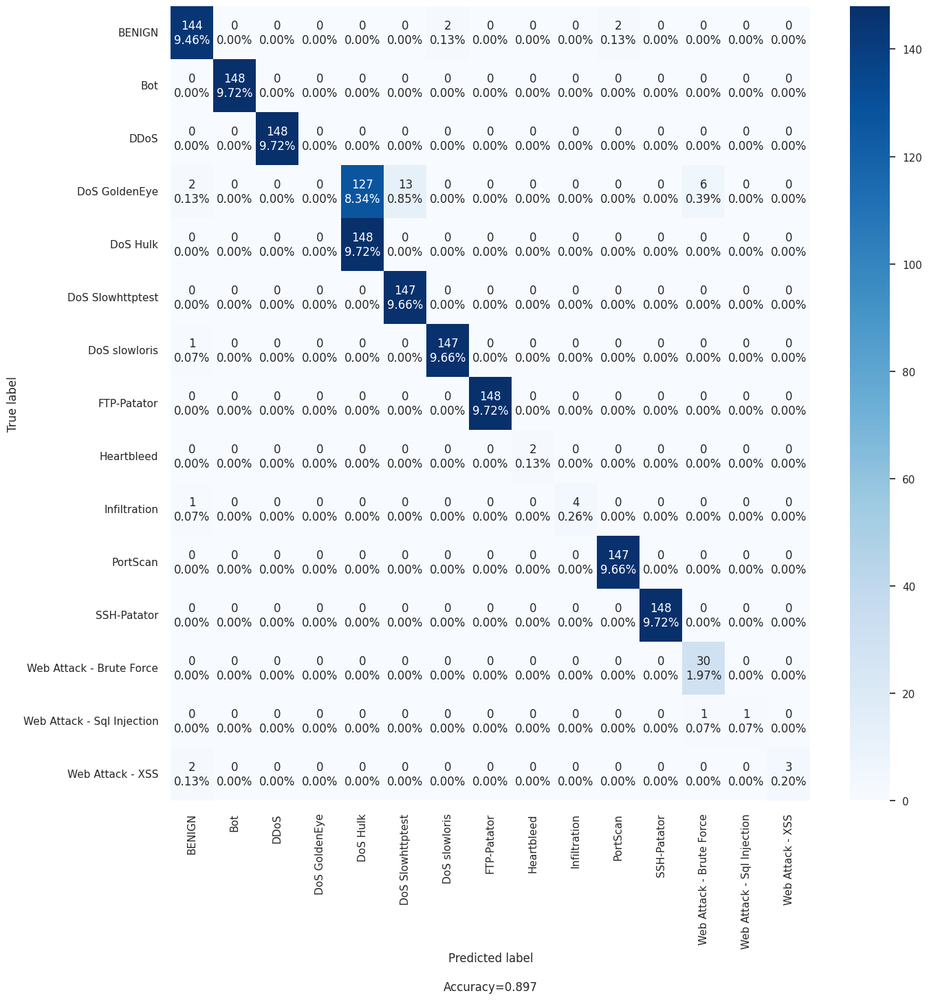

In [79]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [80]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS Hulk']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.6693279	total: 243ms	remaining: 19.2s
1:	learn: 1.3471317	total: 489ms	remaining: 19.1s
2:	learn: 1.1339580	total: 752ms	remaining: 19.3s
3:	learn: 0.9681223	total: 1s	remaining: 19.1s
4:	learn: 0.8408288	total: 1.28s	remaining: 19.2s
5:	learn: 0.7396604	total: 1.57s	remaining: 19.3s
6:	learn: 0.6582325	total: 1.84s	remaining: 19.2s
7:	learn: 0.5890270	total: 2.11s	remaining: 19s
8:	learn: 0.5271303	total: 2.4s	remaining: 18.9s
9:	learn: 0.4745303	total: 2.67s	remaining: 18.7s
10:	learn: 0.4306288	total: 2.94s	remaining: 18.4s
11:	learn: 0.3918279	total: 3.2s	remaining: 18.2s
12:	learn: 0.3569086	total: 3.49s	remaining: 18s
13:	learn: 0.3257301	total: 3.76s	remaining: 17.7s
14:	learn: 0.2978508	total: 4.03s	remaining: 17.5s
15:	learn: 0.2737376	total: 4.3s	remaining: 17.2s
16:	learn: 0.2528220	total: 4.57s	remaining: 16.9s
17:	learn: 0.2330072	total: 4.84s	remaining: 16.7s
18:	learn: 0.2157565	total: 5.12s	remaining: 16.4s
19:	learn: 0.1998387	total: 5.4s	remaining: 16.2s
2

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.998180,0.894875
1,PRECISION,0.998184,0.831762
2,RECALL,0.998180,0.894875
3,F1 SCORE,0.998159,0.856220


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


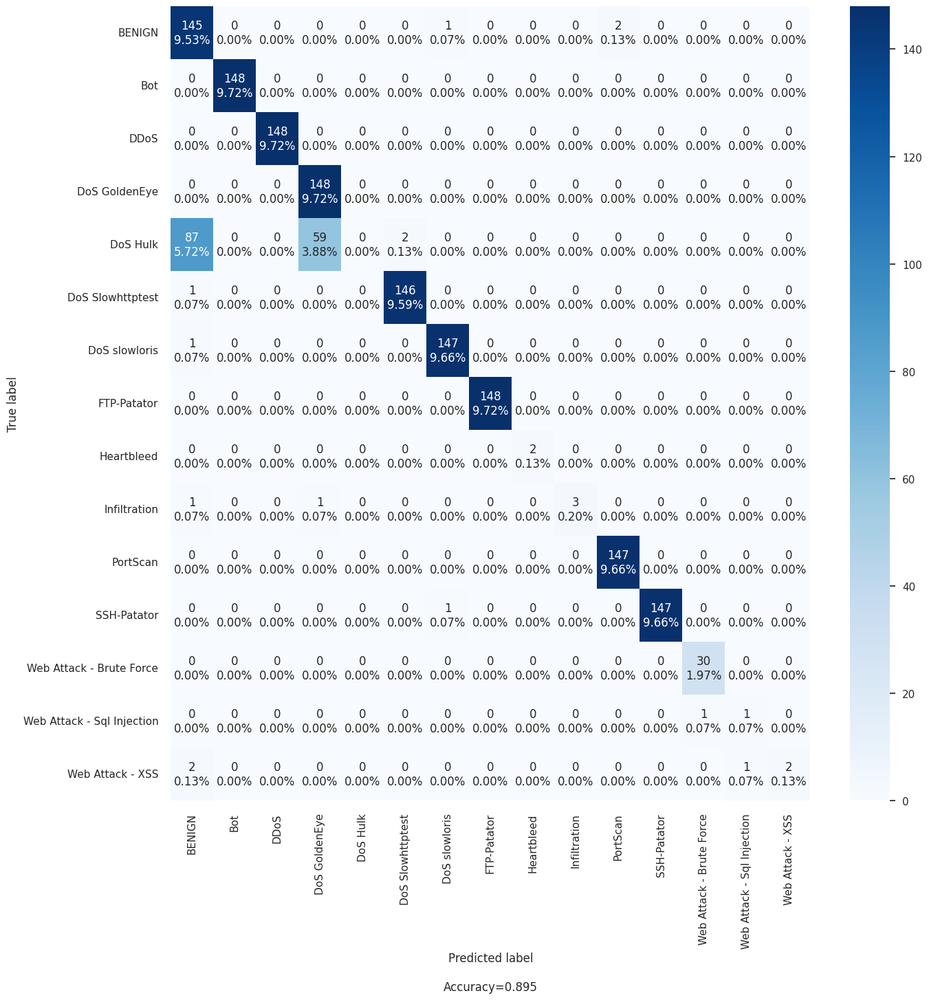

In [81]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [82]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS Slowhttptest']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.6932712	total: 235ms	remaining: 18.6s
1:	learn: 1.3561113	total: 474ms	remaining: 18.5s
2:	learn: 1.1345486	total: 717ms	remaining: 18.4s
3:	learn: 0.9735740	total: 960ms	remaining: 18.2s
4:	learn: 0.8482107	total: 1.21s	remaining: 18.1s
5:	learn: 0.7494644	total: 1.46s	remaining: 18s
6:	learn: 0.6647714	total: 1.71s	remaining: 17.8s
7:	learn: 0.5943838	total: 1.96s	remaining: 17.7s
8:	learn: 0.5345677	total: 2.23s	remaining: 17.6s
9:	learn: 0.4821556	total: 2.53s	remaining: 17.7s
10:	learn: 0.4375543	total: 2.78s	remaining: 17.5s
11:	learn: 0.3977385	total: 3.03s	remaining: 17.2s
12:	learn: 0.3615838	total: 3.28s	remaining: 16.9s
13:	learn: 0.3299126	total: 3.53s	remaining: 16.6s
14:	learn: 0.3011519	total: 3.77s	remaining: 16.3s
15:	learn: 0.2757695	total: 4.01s	remaining: 16s
16:	learn: 0.2537480	total: 4.25s	remaining: 15.8s
17:	learn: 0.2339869	total: 4.49s	remaining: 15.5s
18:	learn: 0.2161130	total: 4.74s	remaining: 15.2s
19:	learn: 0.1997541	total: 4.98s	remaining: 

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.998362,0.895532
1,PRECISION,0.998365,0.839524
2,RECALL,0.998362,0.895532
3,F1 SCORE,0.998351,0.860118


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


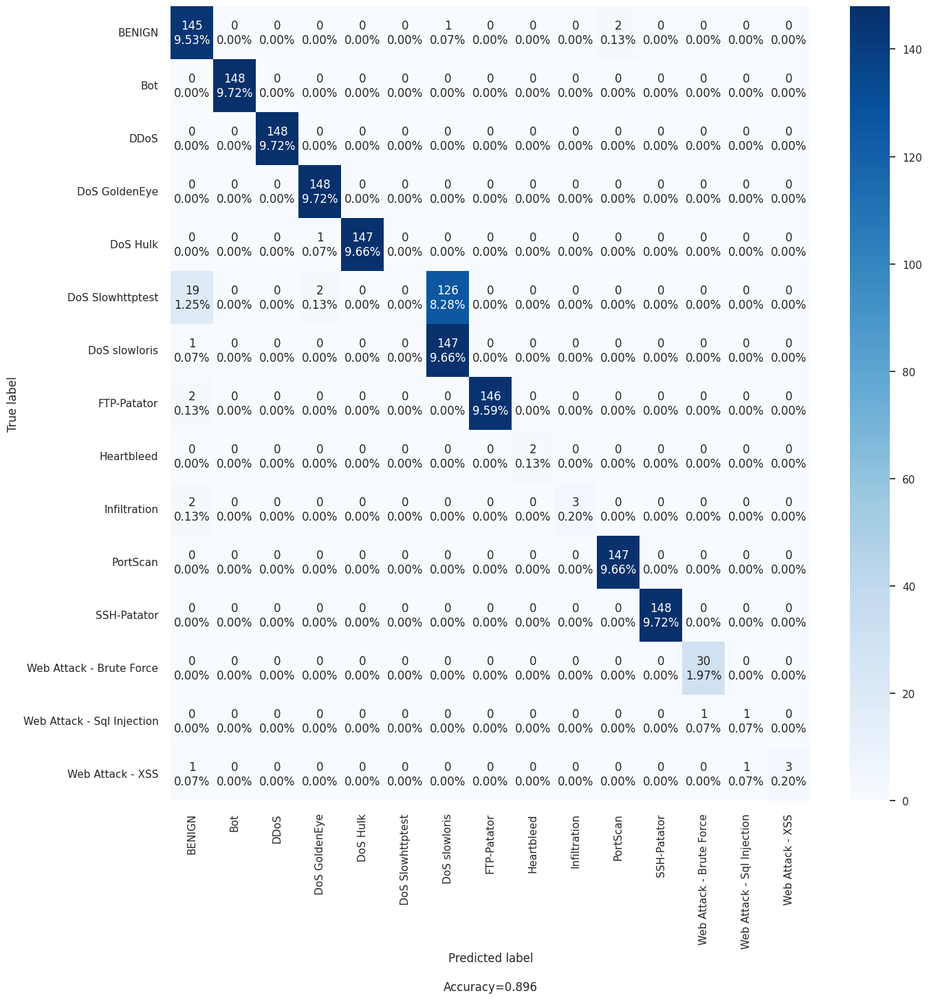

In [83]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [84]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS slowloris']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.6850298	total: 235ms	remaining: 18.5s
1:	learn: 1.3638130	total: 486ms	remaining: 18.9s
2:	learn: 1.1404042	total: 711ms	remaining: 18.2s
3:	learn: 0.9822629	total: 950ms	remaining: 18s
4:	learn: 0.8574155	total: 1.18s	remaining: 17.6s
5:	learn: 0.7544140	total: 1.41s	remaining: 17.4s
6:	learn: 0.6697727	total: 1.64s	remaining: 17.1s
7:	learn: 0.5977181	total: 1.87s	remaining: 16.9s
8:	learn: 0.5385411	total: 2.1s	remaining: 16.6s
9:	learn: 0.4848791	total: 2.33s	remaining: 16.3s
10:	learn: 0.4379055	total: 2.56s	remaining: 16.1s
11:	learn: 0.3981495	total: 2.79s	remaining: 15.8s
12:	learn: 0.3614579	total: 3.01s	remaining: 15.5s
13:	learn: 0.3301988	total: 3.24s	remaining: 15.3s
14:	learn: 0.3004842	total: 3.46s	remaining: 15s
15:	learn: 0.2750321	total: 3.68s	remaining: 14.7s
16:	learn: 0.2540778	total: 3.91s	remaining: 14.5s
17:	learn: 0.2345145	total: 4.14s	remaining: 14.3s
18:	learn: 0.2171201	total: 4.36s	remaining: 14s
19:	learn: 0.2010110	total: 4.6s	remaining: 13.8

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.998908,0.897503
1,PRECISION,0.998910,0.846404
2,RECALL,0.998908,0.897503
3,F1 SCORE,0.998898,0.863868


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


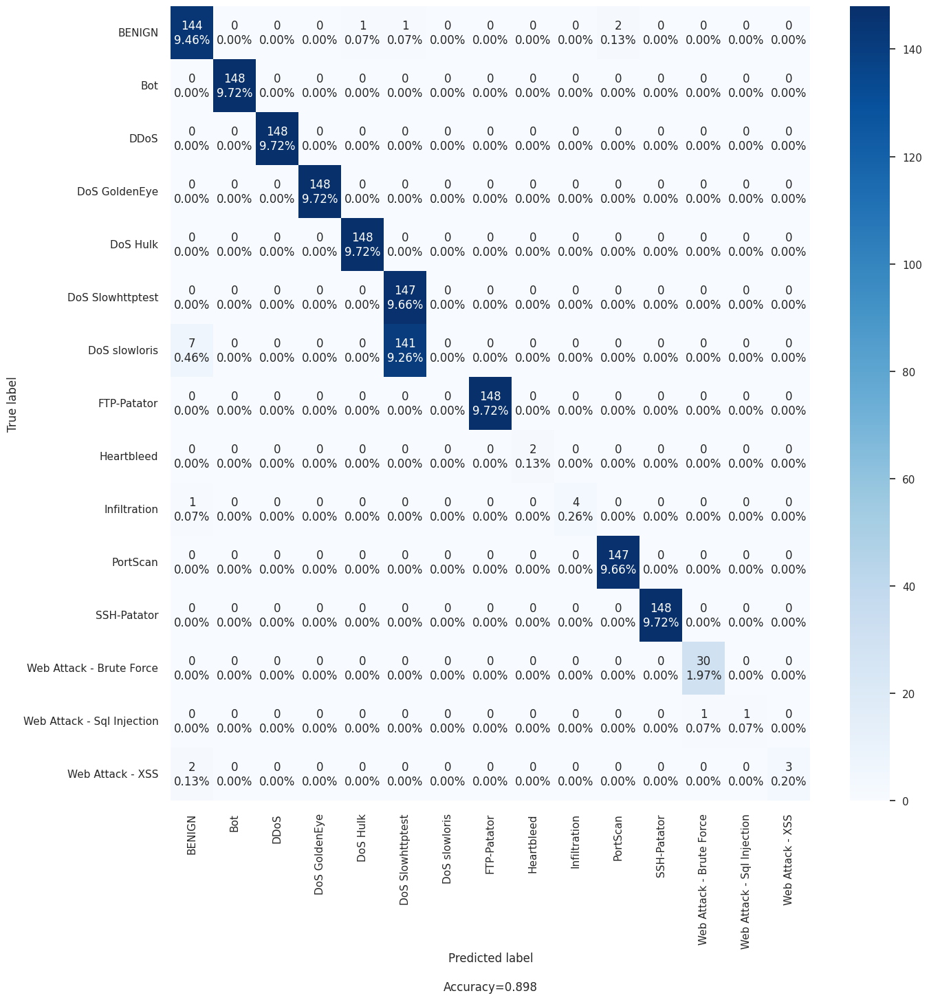

In [85]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [86]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'FTP-Patator']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7033588	total: 202ms	remaining: 16s
1:	learn: 1.3675478	total: 434ms	remaining: 16.9s
2:	learn: 1.1500635	total: 659ms	remaining: 16.9s
3:	learn: 0.9882945	total: 887ms	remaining: 16.9s
4:	learn: 0.8612300	total: 1.12s	remaining: 16.8s
5:	learn: 0.7601497	total: 1.34s	remaining: 16.6s
6:	learn: 0.6732703	total: 1.57s	remaining: 16.4s
7:	learn: 0.6001915	total: 1.8s	remaining: 16.2s
8:	learn: 0.5408503	total: 2.03s	remaining: 16.1s
9:	learn: 0.4884763	total: 2.26s	remaining: 15.8s
10:	learn: 0.4417151	total: 2.48s	remaining: 15.6s
11:	learn: 0.4011520	total: 2.71s	remaining: 15.4s
12:	learn: 0.3644668	total: 2.94s	remaining: 15.1s
13:	learn: 0.3319869	total: 3.17s	remaining: 15s
14:	learn: 0.3037161	total: 3.4s	remaining: 14.8s
15:	learn: 0.2783085	total: 3.64s	remaining: 14.6s
16:	learn: 0.2557522	total: 3.87s	remaining: 14.4s
17:	learn: 0.2359863	total: 4.11s	remaining: 14.1s
18:	learn: 0.2178653	total: 4.34s	remaining: 13.9s
19:	learn: 0.2017144	total: 4.57s	remaining: 13

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.998726,0.897503
1,PRECISION,0.998730,0.849421
2,RECALL,0.998726,0.897503
3,F1 SCORE,0.998716,0.865390


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


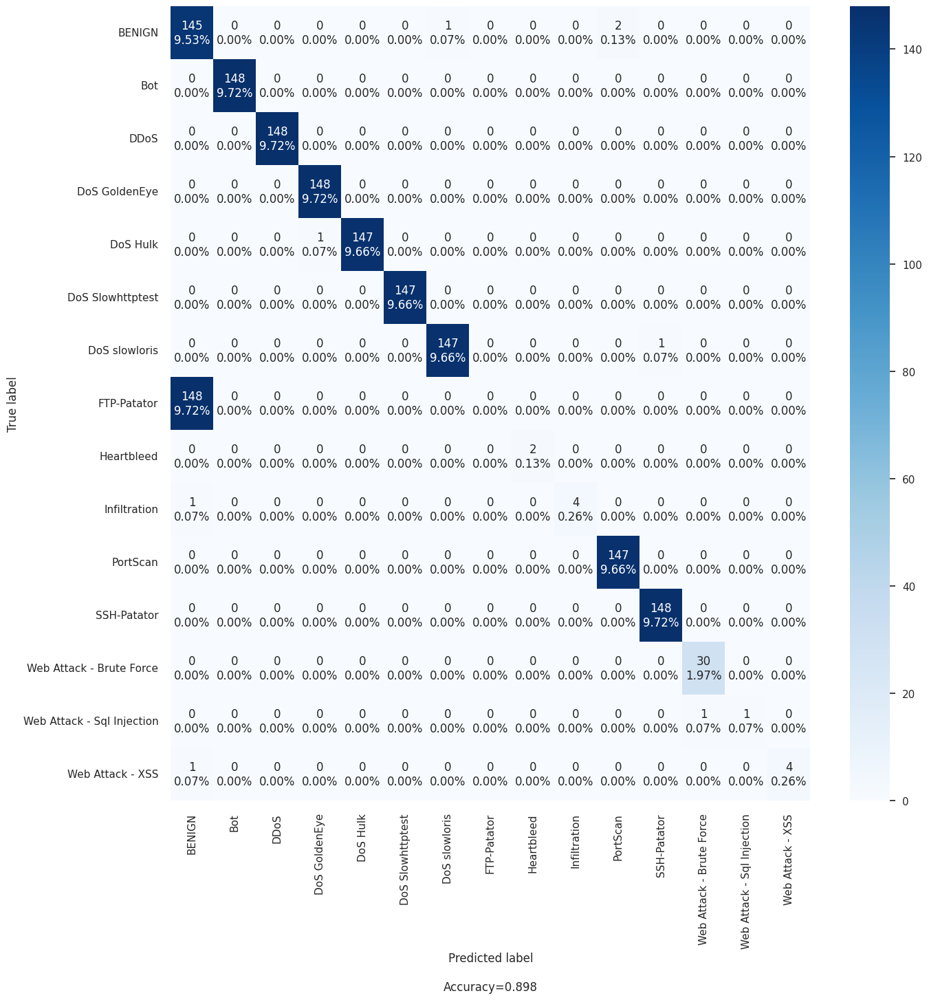

In [87]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [88]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Heartbleed']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.6713324	total: 240ms	remaining: 18.9s
1:	learn: 1.3475855	total: 485ms	remaining: 18.9s
2:	learn: 1.1308168	total: 736ms	remaining: 18.9s
3:	learn: 0.9722027	total: 1s	remaining: 19.1s
4:	learn: 0.8472000	total: 1.28s	remaining: 19.2s
5:	learn: 0.7462214	total: 1.54s	remaining: 19s
6:	learn: 0.6624495	total: 1.84s	remaining: 19.2s
7:	learn: 0.5906338	total: 2.12s	remaining: 19.1s
8:	learn: 0.5301236	total: 2.38s	remaining: 18.8s
9:	learn: 0.4806953	total: 2.66s	remaining: 18.6s
10:	learn: 0.4344083	total: 2.94s	remaining: 18.4s
11:	learn: 0.3946663	total: 3.22s	remaining: 18.2s
12:	learn: 0.3592688	total: 3.49s	remaining: 18s
13:	learn: 0.3277231	total: 3.78s	remaining: 17.8s
14:	learn: 0.2995250	total: 4.06s	remaining: 17.6s
15:	learn: 0.2737607	total: 4.34s	remaining: 17.4s
16:	learn: 0.2520209	total: 4.61s	remaining: 17.1s
17:	learn: 0.2320562	total: 4.89s	remaining: 16.9s
18:	learn: 0.2143135	total: 5.17s	remaining: 16.6s
19:	learn: 0.1989689	total: 5.44s	remaining: 16.

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.998025,0.991459
1,PRECISION,0.998031,0.990368
2,RECALL,0.998025,0.991459
3,F1 SCORE,0.998006,0.990291


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


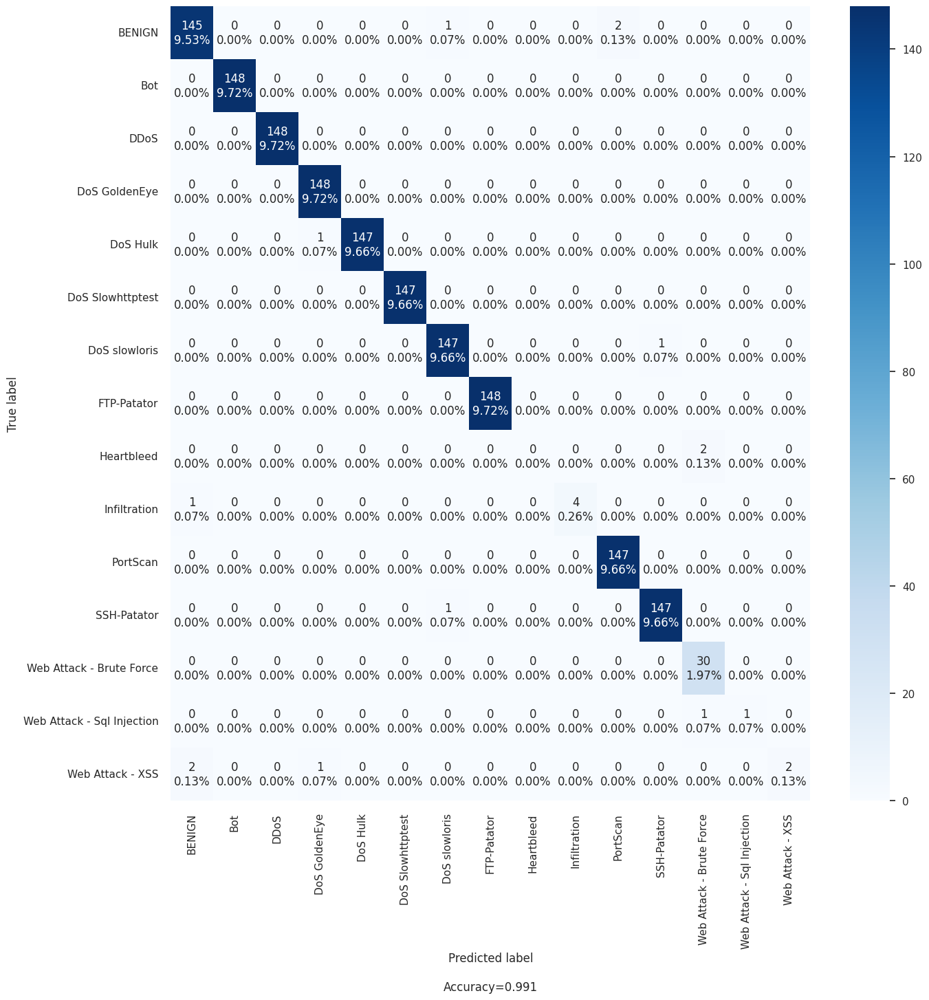

In [89]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [90]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Infiltration']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.6634145	total: 255ms	remaining: 20.1s
1:	learn: 1.3416383	total: 568ms	remaining: 22.2s
2:	learn: 1.1286392	total: 851ms	remaining: 21.8s
3:	learn: 0.9657475	total: 1.13s	remaining: 21.5s
4:	learn: 0.8426890	total: 1.4s	remaining: 21s
5:	learn: 0.7417405	total: 1.68s	remaining: 20.8s
6:	learn: 0.6576245	total: 1.96s	remaining: 20.4s
7:	learn: 0.5858605	total: 2.23s	remaining: 20.1s
8:	learn: 0.5283869	total: 2.5s	remaining: 19.8s
9:	learn: 0.4780973	total: 2.78s	remaining: 19.4s
10:	learn: 0.4310574	total: 3.05s	remaining: 19.1s
11:	learn: 0.3901493	total: 3.32s	remaining: 18.8s
12:	learn: 0.3549877	total: 3.6s	remaining: 18.5s
13:	learn: 0.3242580	total: 3.86s	remaining: 18.2s
14:	learn: 0.2960076	total: 4.14s	remaining: 17.9s
15:	learn: 0.2716621	total: 4.4s	remaining: 17.6s
16:	learn: 0.2492027	total: 4.67s	remaining: 17.3s
17:	learn: 0.2297211	total: 4.97s	remaining: 17.1s
18:	learn: 0.2122359	total: 5.24s	remaining: 16.8s
19:	learn: 0.1964235	total: 5.53s	remaining: 16

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.997856,0.990802
1,PRECISION,0.997869,0.987694
2,RECALL,0.997856,0.990802
3,F1 SCORE,0.997822,0.988685


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


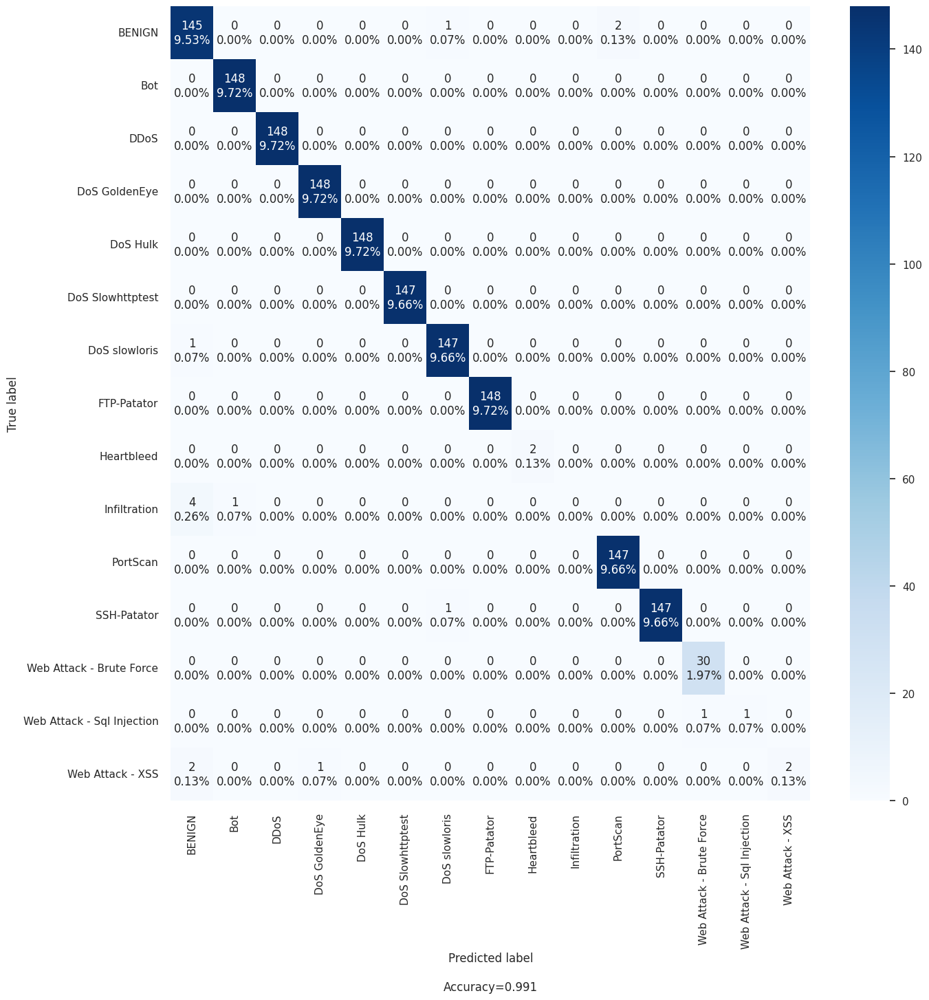

In [91]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [92]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'PortScan']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.6926930	total: 243ms	remaining: 19.2s
1:	learn: 1.3550824	total: 487ms	remaining: 19s
2:	learn: 1.1376349	total: 740ms	remaining: 19s
3:	learn: 0.9771797	total: 995ms	remaining: 18.9s
4:	learn: 0.8527410	total: 1.25s	remaining: 18.8s
5:	learn: 0.7513902	total: 1.53s	remaining: 18.9s
6:	learn: 0.6662134	total: 1.81s	remaining: 18.8s
7:	learn: 0.5959901	total: 2.07s	remaining: 18.6s
8:	learn: 0.5339935	total: 2.33s	remaining: 18.4s
9:	learn: 0.4823527	total: 2.6s	remaining: 18.2s
10:	learn: 0.4357110	total: 2.87s	remaining: 18s
11:	learn: 0.3941109	total: 3.14s	remaining: 17.8s
12:	learn: 0.3593384	total: 3.41s	remaining: 17.6s
13:	learn: 0.3284927	total: 3.68s	remaining: 17.4s
14:	learn: 0.3002641	total: 3.95s	remaining: 17.1s
15:	learn: 0.2754377	total: 4.23s	remaining: 16.9s
16:	learn: 0.2535799	total: 4.51s	remaining: 16.7s
17:	learn: 0.2338451	total: 4.79s	remaining: 16.5s
18:	learn: 0.2159911	total: 5.05s	remaining: 16.2s
19:	learn: 0.1997252	total: 5.32s	remaining: 16s

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.998544,0.898160
1,PRECISION,0.998545,0.851554
2,RECALL,0.998544,0.898160
3,F1 SCORE,0.998522,0.866358


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


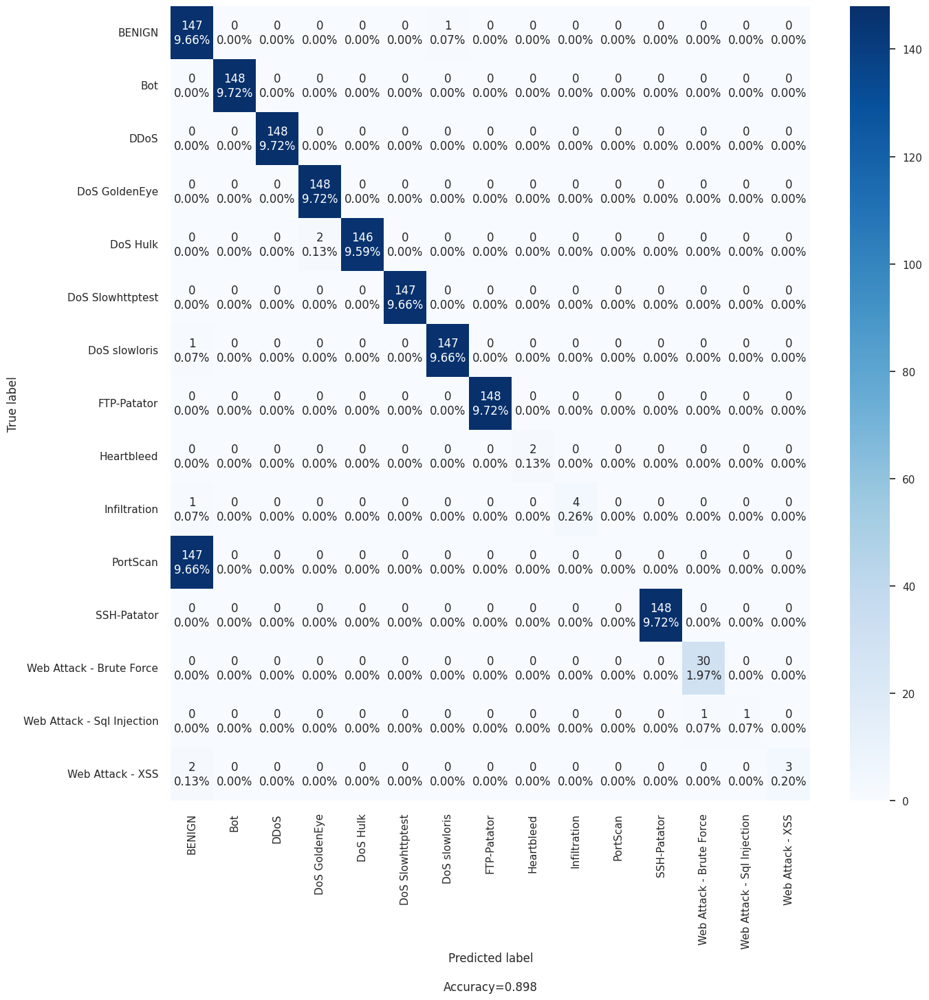

In [93]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [94]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'SSH-Patator']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.6855402	total: 249ms	remaining: 19.6s
1:	learn: 1.3561209	total: 491ms	remaining: 19.1s
2:	learn: 1.1433131	total: 748ms	remaining: 19.2s
3:	learn: 0.9825129	total: 1s	remaining: 19.1s
4:	learn: 0.8583210	total: 1.26s	remaining: 18.8s
5:	learn: 0.7561104	total: 1.53s	remaining: 18.9s
6:	learn: 0.6701947	total: 1.79s	remaining: 18.7s
7:	learn: 0.5987752	total: 2.06s	remaining: 18.5s
8:	learn: 0.5405724	total: 2.32s	remaining: 18.3s
9:	learn: 0.4888930	total: 2.6s	remaining: 18.2s
10:	learn: 0.4408384	total: 2.87s	remaining: 18s
11:	learn: 0.4006260	total: 3.14s	remaining: 17.8s
12:	learn: 0.3656852	total: 3.41s	remaining: 17.6s
13:	learn: 0.3356214	total: 3.67s	remaining: 17.3s
14:	learn: 0.3073515	total: 3.93s	remaining: 17s
15:	learn: 0.2826594	total: 4.22s	remaining: 16.9s
16:	learn: 0.2606334	total: 4.48s	remaining: 16.6s
17:	learn: 0.2404255	total: 4.76s	remaining: 16.4s
18:	learn: 0.2223723	total: 5.03s	remaining: 16.1s
19:	learn: 0.2064811	total: 5.3s	remaining: 15.9s

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.998544,0.896189
1,PRECISION,0.998563,0.849580
2,RECALL,0.998544,0.896189
3,F1 SCORE,0.998527,0.864608


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


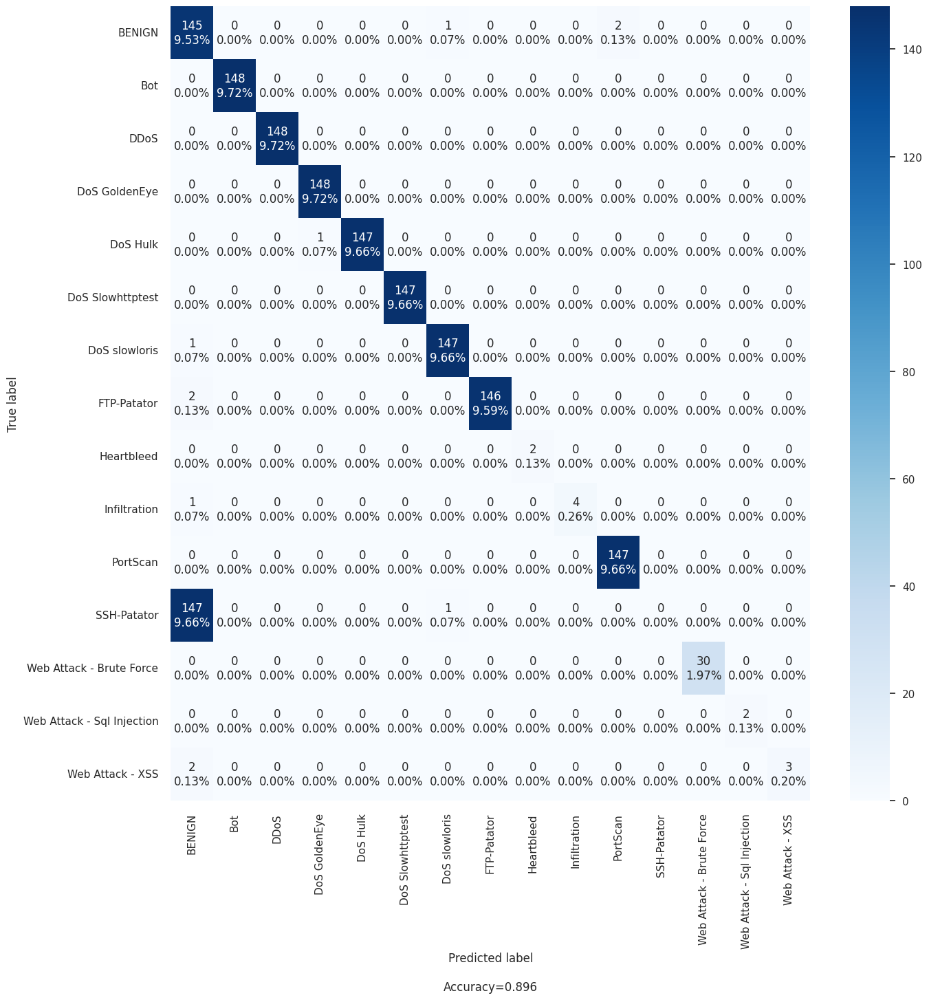

In [95]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [96]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Web Attack - Brute Force']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.6572640	total: 205ms	remaining: 16.2s
1:	learn: 1.3343128	total: 427ms	remaining: 16.6s
2:	learn: 1.1161290	total: 670ms	remaining: 17.2s
3:	learn: 0.9545266	total: 905ms	remaining: 17.2s
4:	learn: 0.8294245	total: 1.13s	remaining: 17s
5:	learn: 0.7290558	total: 1.36s	remaining: 16.8s
6:	learn: 0.6459611	total: 1.62s	remaining: 16.9s
7:	learn: 0.5732327	total: 1.85s	remaining: 16.7s
8:	learn: 0.5142059	total: 2.08s	remaining: 16.4s
9:	learn: 0.4640013	total: 2.31s	remaining: 16.2s
10:	learn: 0.4194261	total: 2.55s	remaining: 16s
11:	learn: 0.3804404	total: 2.79s	remaining: 15.8s
12:	learn: 0.3457805	total: 3.02s	remaining: 15.6s
13:	learn: 0.3153895	total: 3.25s	remaining: 15.3s
14:	learn: 0.2882156	total: 3.48s	remaining: 15.1s
15:	learn: 0.2639453	total: 3.71s	remaining: 14.8s
16:	learn: 0.2428648	total: 3.94s	remaining: 14.6s
17:	learn: 0.2234586	total: 4.17s	remaining: 14.4s
18:	learn: 0.2058254	total: 4.4s	remaining: 14.1s
19:	learn: 0.1902841	total: 4.64s	remaining: 1

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.998491,0.973062
1,PRECISION,0.998510,0.964445
2,RECALL,0.998491,0.973062
3,F1 SCORE,0.998475,0.967948


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


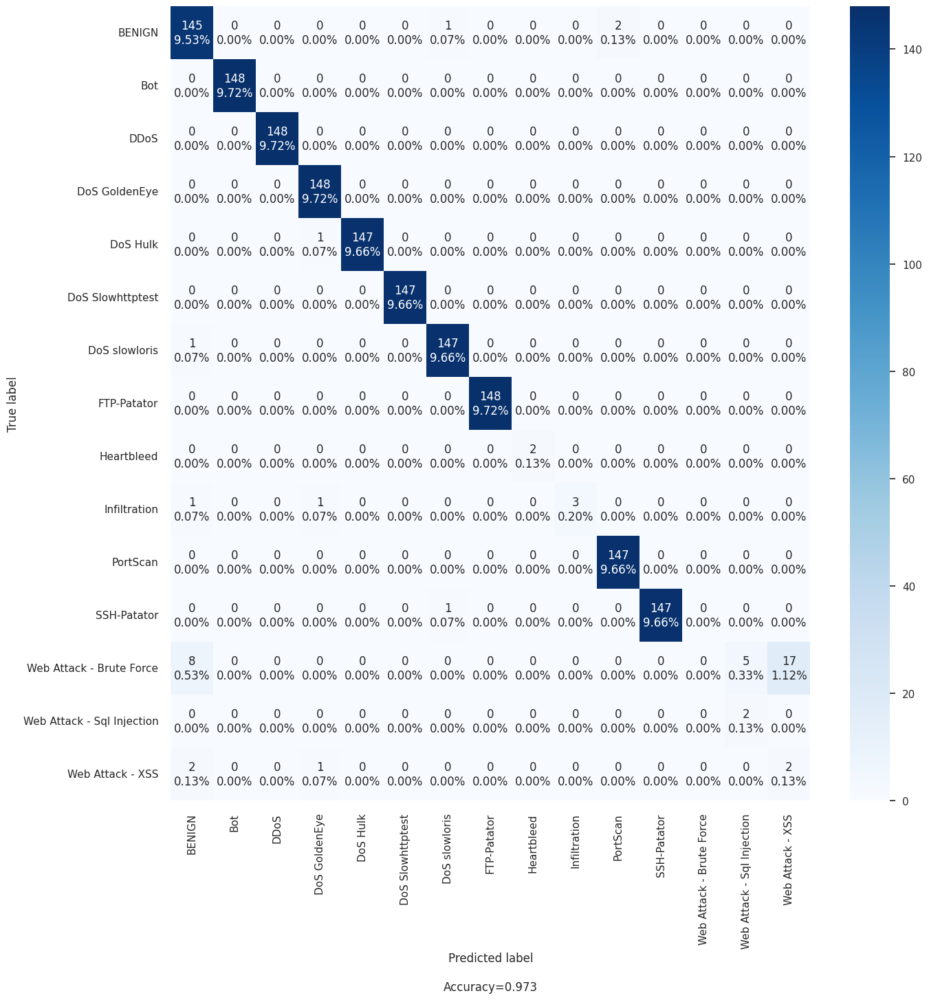

In [97]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [98]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Web Attack - Sql Injection']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.6937994	total: 196ms	remaining: 15.5s
1:	learn: 1.3687698	total: 422ms	remaining: 16.5s
2:	learn: 1.1415619	total: 646ms	remaining: 16.6s
3:	learn: 0.9795713	total: 878ms	remaining: 16.7s
4:	learn: 0.8534751	total: 1.13s	remaining: 16.9s
5:	learn: 0.7497368	total: 1.37s	remaining: 16.9s
6:	learn: 0.6639063	total: 1.6s	remaining: 16.7s
7:	learn: 0.5888936	total: 1.83s	remaining: 16.5s
8:	learn: 0.5301977	total: 2.06s	remaining: 16.2s
9:	learn: 0.4802887	total: 2.29s	remaining: 16s
10:	learn: 0.4344047	total: 2.51s	remaining: 15.7s
11:	learn: 0.3950680	total: 2.74s	remaining: 15.5s
12:	learn: 0.3587605	total: 2.97s	remaining: 15.3s
13:	learn: 0.3279991	total: 3.19s	remaining: 15.1s
14:	learn: 0.2997013	total: 3.43s	remaining: 14.9s
15:	learn: 0.2749506	total: 3.67s	remaining: 14.7s
16:	learn: 0.2526721	total: 3.9s	remaining: 14.5s
17:	learn: 0.2322898	total: 4.14s	remaining: 14.2s
18:	learn: 0.2143697	total: 4.37s	remaining: 14s
19:	learn: 0.1982146	total: 4.59s	remaining: 13

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.998354,0.992116
1,PRECISION,0.998358,0.990858
2,RECALL,0.998354,0.992116
3,F1 SCORE,0.998351,0.991305


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


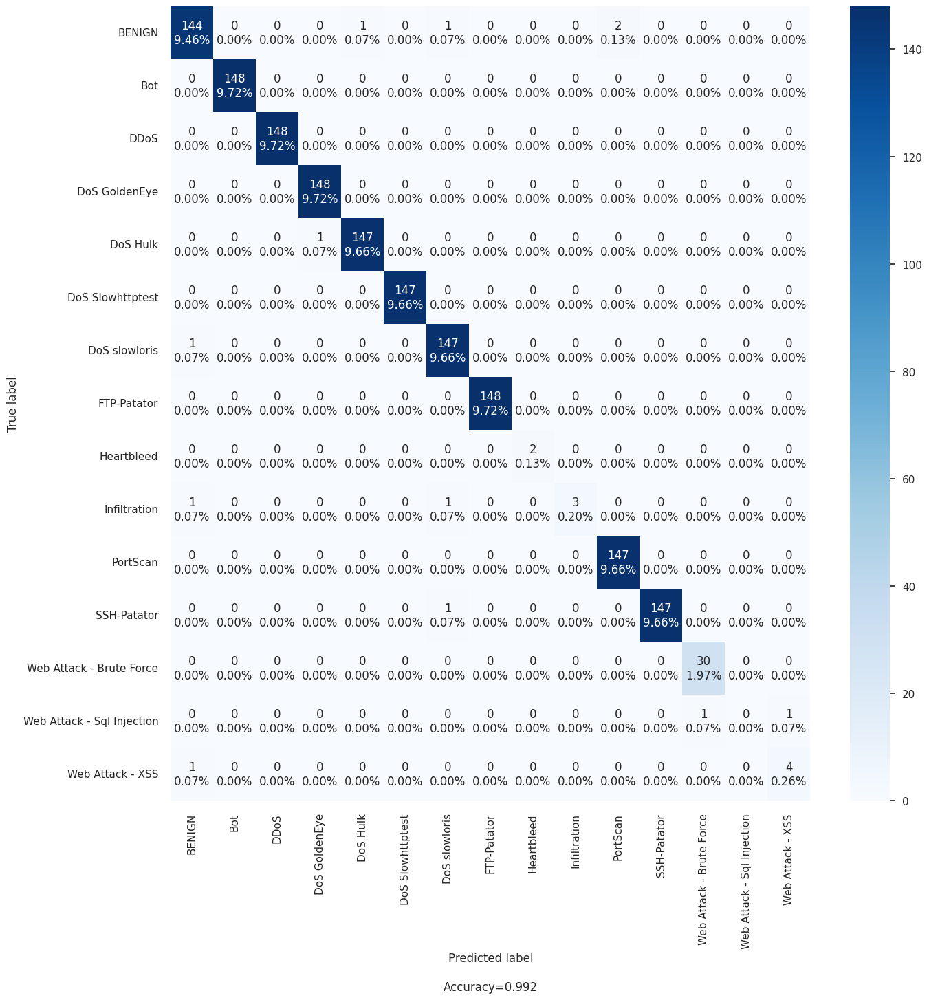

In [99]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [100]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Web Attack - XSS']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.6627929	total: 205ms	remaining: 16.2s
1:	learn: 1.3405237	total: 430ms	remaining: 16.8s
2:	learn: 1.1213470	total: 672ms	remaining: 17.3s
3:	learn: 0.9629568	total: 908ms	remaining: 17.3s
4:	learn: 0.8389619	total: 1.14s	remaining: 17s
5:	learn: 0.7394726	total: 1.37s	remaining: 16.8s
6:	learn: 0.6532238	total: 1.6s	remaining: 16.7s
7:	learn: 0.5817518	total: 1.83s	remaining: 16.5s
8:	learn: 0.5223292	total: 2.08s	remaining: 16.4s
9:	learn: 0.4709696	total: 2.32s	remaining: 16.3s
10:	learn: 0.4253567	total: 2.57s	remaining: 16.1s
11:	learn: 0.3858409	total: 2.81s	remaining: 15.9s
12:	learn: 0.3505519	total: 3.05s	remaining: 15.7s
13:	learn: 0.3203230	total: 3.3s	remaining: 15.6s
14:	learn: 0.2926432	total: 3.54s	remaining: 15.3s
15:	learn: 0.2676820	total: 3.78s	remaining: 15.1s
16:	learn: 0.2459245	total: 4.02s	remaining: 14.9s
17:	learn: 0.2265458	total: 4.26s	remaining: 14.7s
18:	learn: 0.2097287	total: 4.51s	remaining: 14.5s
19:	learn: 0.1950359	total: 4.74s	remaining: 

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.998681,0.990802
1,PRECISION,0.998683,0.987770
2,RECALL,0.998681,0.990802
3,F1 SCORE,0.998675,0.989066


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


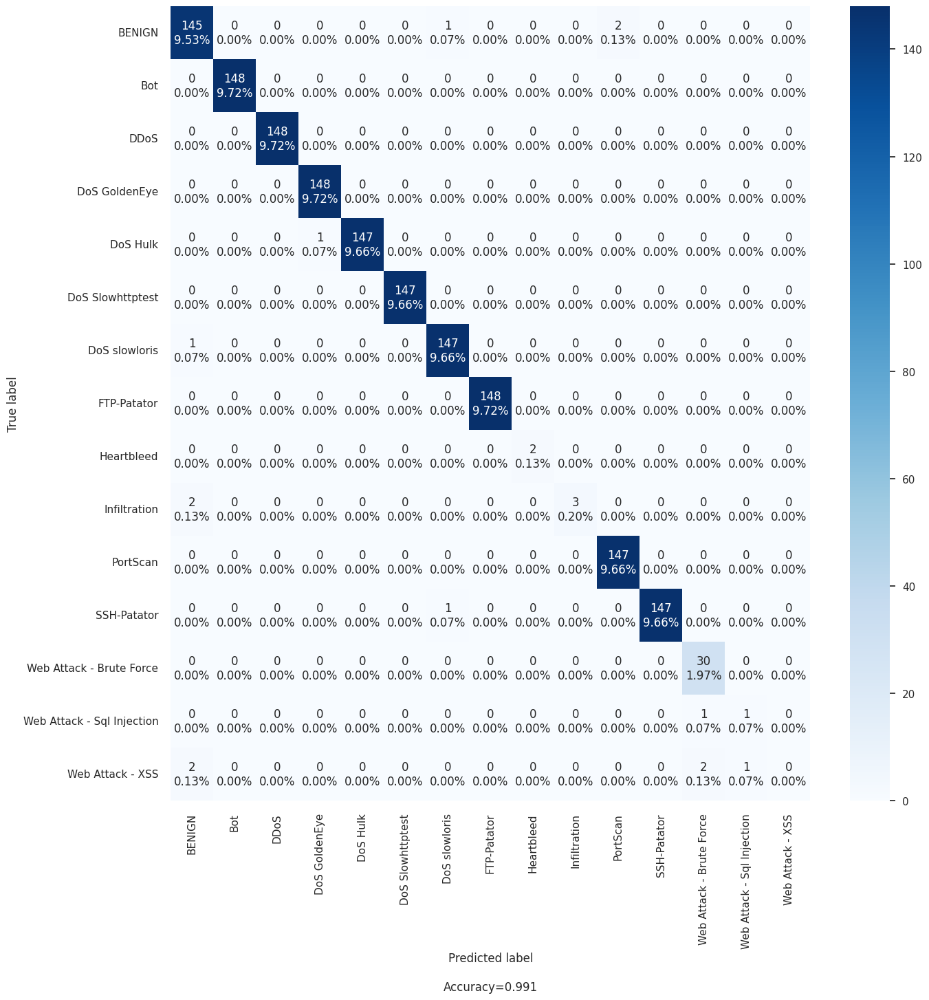

In [101]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))